# This notebooks shows scoring synthetic and genomic enhancer by using the Enformer model.

#### Enformer model is loaded from "https://tfhub.dev/deepmind/enformer/1"
#### Enformer class annotation is in ./data/enformer folder.
#### It uses the synthetic sequences file generated via MM_using_DeepMELs notebook. 		
#### The intermediate prediction files are in ./data/enformer folder.
#### Figures are saved to ./figures/enformer folder.

### General imports


In [1]:
import sys  
import os
import pickle
import utils
import numpy as np
import scipy
import tensorflow as tf
from tensorflow.python.keras.backend import set_session
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.style.use("default")
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

import enformer_funcs as ef
import kipoiseq
from kipoiseq import Interval
import pyfaidx
import pandas as pd
import seaborn as sns
from pybedtools import BedTool
from tqdm import tqdm
%config InlineBackend.figure_format = 'retina'

2023-07-17 06:36:38.271069: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0


### Loading Enformer

In [2]:
SEQUENCE_LENGTH = 393_216
species = 'human'
genomefile_path ='/staging/leuven/stg_00002/lcb/resources/human/hg19/Homo_sapiens_assembly19_sorted.fa'
fasta_extractor = ef.FastaStringExtractor(genomefile_path)
model = ef.Enformer("https://tfhub.dev/deepmind/enformer/1")

2023-07-17 06:37:45.861766: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-07-17 06:37:45.877696: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2023-07-17 06:37:46.208890: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:19:00.0 name: NVIDIA A100-SXM4-80GB computeCapability: 8.0
coreClock: 1.41GHz coreCount: 108 deviceMemorySize: 79.15GiB deviceMemoryBandwidth: 1.85TiB/s
2023-07-17 06:37:46.208941: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2023-07-17 06:37:47.080387: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2023-07-17 06:37:47.080495: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2

### Reading the Enformer classes metadata file

In [3]:
enformer_classes = {}
with open("data/enformer/Enformer_classes.txt",'r') as fr:
    for line in fr:
        if line.startswith('index'):
            continue
        sep_line = line.split("\t")
        enformer_classes[int(sep_line[0])] = sep_line[9]

### Printing the name of the Enformer classes that are related to the cell lines and TFs used in our study

In [4]:
for index in [40,162,168,380,427,1601,1912,1924,2162,2171,2435,2518,2532,2614,2737,2928,3020,3217,3588,3636,3934,4431,4832,4857,4867,5118]:
    print(index, enformer_classes[index])
print("")
for index in [1457,2429,2719,2721,4259]:
    print(index, enformer_classes[index])
print("")
for index in [1431,3920]:
    print(index, enformer_classes[index])
print("")
for index in [4583]:
    print(index, enformer_classes[index])

40 DNase/epidermal melanocyte
162 DNase/SK-MEL-5
168 DNase/SK-MEL-5
380 DNase/foreskin melanocyte male newborn
427 DNase/foreskin melanocyte male newborn
1601 ChIP-Histone:H3K4me1/foreskin melanocyte male newborn
1912 ChIP-Histone:H3K27me3/foreskin melanocyte male newborn
1924 ChIP-Histone:H3K9ac/foreskin melanocyte male newborn
2162 ChIP-Histone:H3K27ac/foreskin melanocyte male newborn
2171 ChIP-Histone:H3K27me3/foreskin melanocyte male newborn
2435 ChIP-Histone:H3K36me3/foreskin melanocyte male newborn
2518 ChIP-Histone:H3K4me3/foreskin melanocyte male newborn
2532 ChIP-Histone:H3K9me3/foreskin melanocyte male newborn
2614 ChIP-Histone:H3K4me1/foreskin melanocyte male newborn
2737 ChIP-Histone:H3K4me3/foreskin melanocyte male newborn
2928 ChIP-Histone:H3K4me3/foreskin melanocyte male newborn
3020 ChIP-Histone:H3K36me3/foreskin melanocyte male newborn
3217 ChIP-Histone:H3K9me3/foreskin melanocyte male newborn
3588 ChIP-Histone:H3K27ac/foreskin melanocyte male newborn
3636 ChIP-Histone

### Calculating prediction scores on IRF4 locus

In [5]:
sequence_one_hot_i = {}
target_interval = kipoiseq.Interval('chr6', 396104-57094, 396604+57094) 
sequence_one_hot_i['irf4_locus'] = ef.one_hot_encode(fasta_extractor.extract(target_interval.resize(SEQUENCE_LENGTH)))

predictions_i = {}
predictions_i['irf4_locus'] = model.predict_on_batch(sequence_one_hot_i['irf4_locus'][np.newaxis])[species][0]

2023-07-17 06:37:57.515972: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-07-17 06:37:58.036974: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2400000000 Hz
2023-07-17 06:38:00.341429: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2023-07-17 06:38:07.887178: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublasLt.so.11
2023-07-17 06:38:07.952901: I tensorflow/stream_executor/cuda/cuda_blas.cc:1838] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-07-17 06:38:08.798325: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.8


In [6]:
sequence_one_hot_i['irf4_locus'].shape

(393216, 4)

In [7]:
393216/2 - 250

196358.0

### Function that scores the sequences 3 times by shifting 1bp upstream and 1bp downstream
### The sequences are replaced with the IRF4 enhancer before scoring

In [8]:
def pred_3bp(main_seq, inserted_seq, species='human'):
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196357:196357+500,:] = inserted_seq
    pred_l = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196358:196358+500,:] = inserted_seq
    pred_m = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196359:196359+500,:] = inserted_seq
    pred_r = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    return np.mean((pred_l,pred_m,pred_r),axis=0)

### Loading the IRF4 enhancer sequence with different motif modifications and calculating prediction scores

In [9]:
irf4_onehot = {}
irf4_onehot["wild-type"] = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["more_ZEB2"] = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGGTGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTACCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACCTTGGTAGGTAAAAGAAGGTAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACCTAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACCTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_MITF"]   = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATAATGTAAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCAATATAACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_SOX10"]  = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGGATGACAGCTTGTGTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACATAAAACAGTACAGGTATCTCCATGTGCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_ZEB2"]   = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCGGATCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCGGATTTAGCCATATGACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")

predictions_irf4 = {}
for seq_ in irf4_onehot:
    predictions_irf4[seq_] =  pred_3bp(sequence_one_hot_i['irf4_locus'],irf4_onehot[seq_])

In [10]:
predictions_irf4["wild-type"].shape

(896, 5313)

In [11]:
896/2

448.0

### Plotting mean prediction scores for DNase tracks at the location where the IRF4 enhancer is

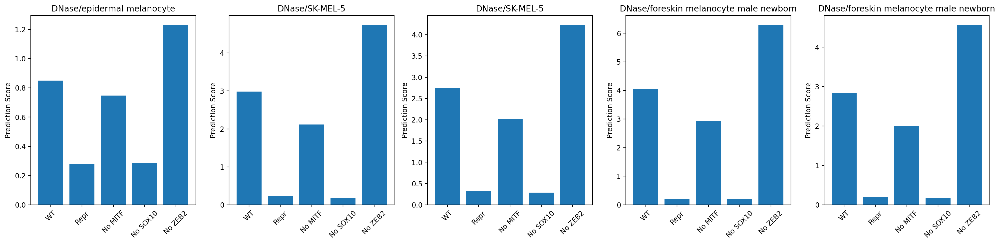

In [12]:
fig, axes = plt.subplots(1, 5, figsize=(20, 5))

for ax_,enformer_class in enumerate([40,162,168,380,427]):
    for i,key in enumerate(predictions_irf4):
        axes[ax_].bar(i,np.mean(np.array(predictions_irf4[key])[[446,447,448],enformer_class].T),label=key,color="C0")

for ax_,enformer_class in enumerate([40,162,168,380,427]):
    axes[ax_].set_xticks(range(5),['WT',"Repr","No MITF","No SOX10","No ZEB2"],rotation=45)
    axes[ax_].set_ylabel("Prediction Score")
    axes[ax_].set_title(enformer_classes[enformer_class])

fig.tight_layout()

plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_DNase_EnhancerLoc.pdf",transparent=True)

### Plotting mean prediction scores for CAGE tracks at the location where the IRF4 TSS is

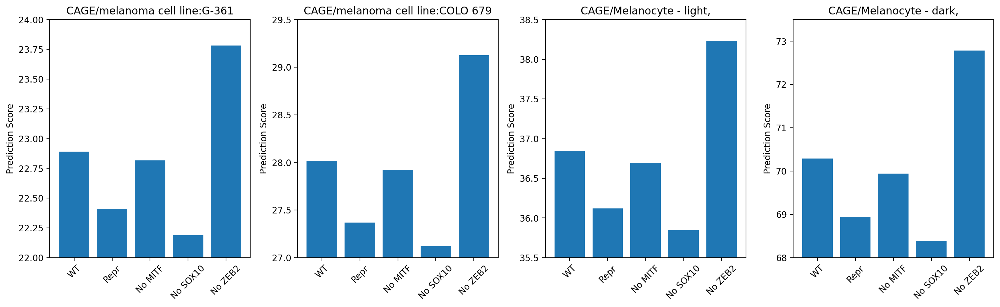

In [13]:
fig, axes = plt.subplots(1, 4, figsize=(16, 5))

for ax_,enformer_class in enumerate([4832,4857,4867,5118]):
    for i,key in enumerate(predictions_irf4):
        axes[ax_].bar(i,np.array(predictions_irf4[key])[412,enformer_class].T,label=key,color="C0")

for ax_,enformer_class in enumerate([4832,4857,4867,5118]):
    axes[ax_].set_xticks(range(5),['WT',"Repr","No MITF","No SOX10","No ZEB2"],rotation=45)
    axes[ax_].set_ylabel("Prediction Score")
    axes[ax_].set_title(enformer_classes[enformer_class])
    
axes[0].set_ylim(22,24)
axes[1].set_ylim(27,29.5)
axes[2].set_ylim(35.5,38.5)
axes[3].set_ylim(68,73.5)
fig.tight_layout()

plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_CAGE_TSSLoc.pdf",transparent=True)

### Plotting mean prediction scores for H3K27ac tracks at the location where the IRF4 enhancer is

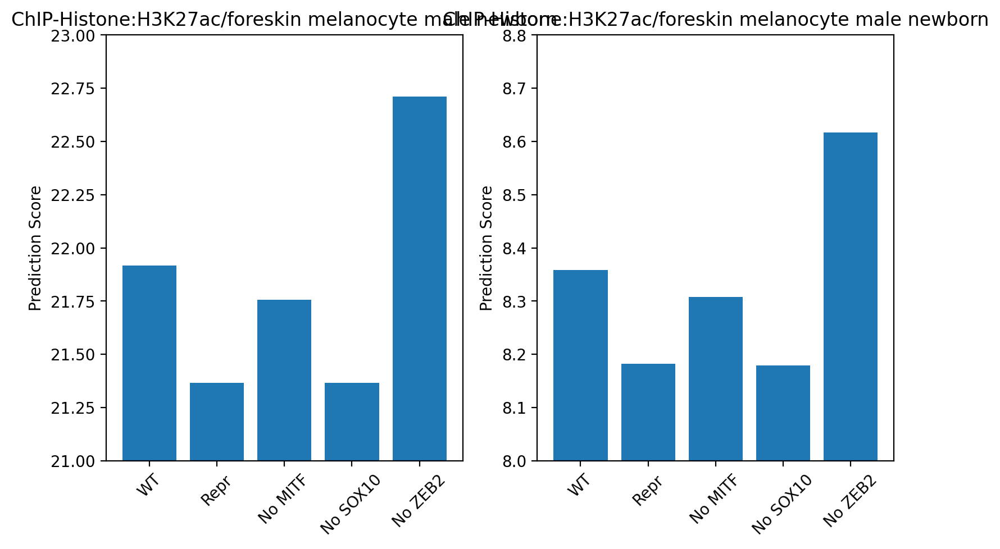

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(8, 5))

for ax_,enformer_class in enumerate([2162,3588]):
    for i,key in enumerate(predictions_irf4):
        axes[ax_].bar(i,np.array(predictions_irf4[key])[412,enformer_class].T,label=key,color="C0")

for ax_,enformer_class in enumerate([2162,3588]):
    axes[ax_].set_xticks(range(5),['WT',"Repr","No MITF","No SOX10","No ZEB2"],rotation=45)
    axes[ax_].set_ylabel("Prediction Score")
    axes[ax_].set_title(enformer_classes[enformer_class])

axes[0].set_ylim(21,23)
axes[1].set_ylim(8,8.8)
fig.tight_layout()

plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_H3K27ac_EnhancerLoc.pdf",transparent=True)

### Loading IRF4 gtf files 

In [12]:
import pyranges as pr
import matplotlib.patches as mpatches
pr_irf4_gtf = pr.read_gtf("data/enformer/hg19.refGene.IRF4.gtf")

### Plotting predictions on the irf4 locus with an IRF4 enhancer sequence that has different motif modifications

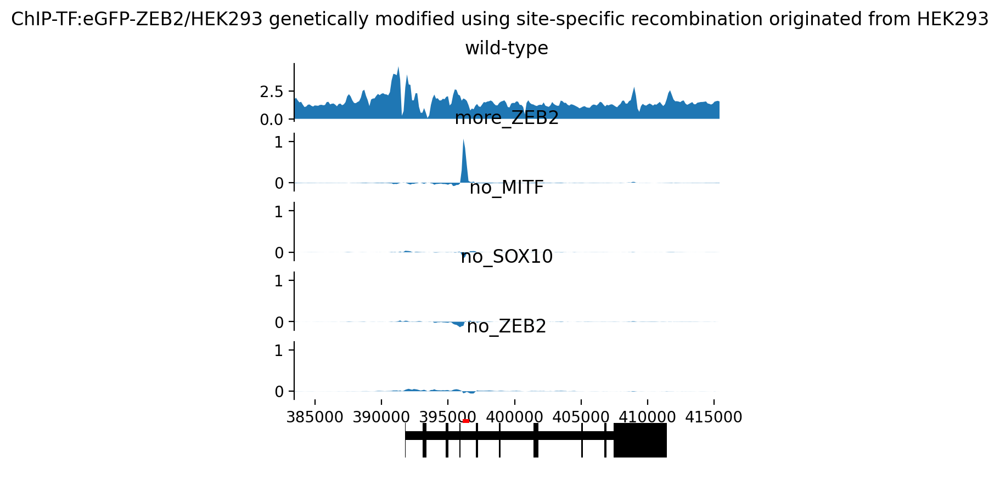

In [18]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

enformer_class = 2719

n_tracks = 6
fig = plt.figure(figsize=(5,0.8*n_tracks))
fig.suptitle(enformer_classes[enformer_class])
ax  = fig.add_subplot(n_tracks,1,1)
values = predictions_irf4['wild-type'][447-100:447+150,enformer_class]
ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
ax.set_xticks([])
ax.set_title("wild-type")
ax.margins(x=0)

for i,key in enumerate(['more_ZEB2', 'no_MITF', 'no_SOX10', 'no_ZEB2']):
    ax = fig.add_subplot(n_tracks,1,i+2)
    values = predictions_irf4[key][447-100:447+150,enformer_class] - predictions_irf4['wild-type'][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
    ax.set_ylim(-0.2,1.2)
    ax.set_title(key)
    ax.margins(x=0)
    if i!=3:
        ax.set_xticks([])

sns.despine(top=True, right=True, bottom=True)

for ax_no in [6]:
    ax  = fig.add_subplot(n_tracks,1,ax_no)
    gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
    genes_in_window = set(gtf_region_intersect.gene_name)
    n_genes_in_window = len(genes_in_window)
    for idx, _gene in enumerate(genes_in_window):
        for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
            if part['Feature'] == 'exon':
                exon_start = part['Start']
                exon_end = part['End']
                rect = mpatches.Rectangle(
                    (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
            elif part['Feature'] == 'transcript':
                gene_start = part['Start']
                gene_end = part['End']
                rect = mpatches.Rectangle(
                    (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
   
    rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
    ax.add_patch(rect)
    ax.set_ylim([-2/1.2, 2/1.2])
    ax.set_xlim([start,end])
    sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.patch.set_alpha(0)
    
#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_ChIP-ZEB2_IRF4Locus.pdf",transparent=True)

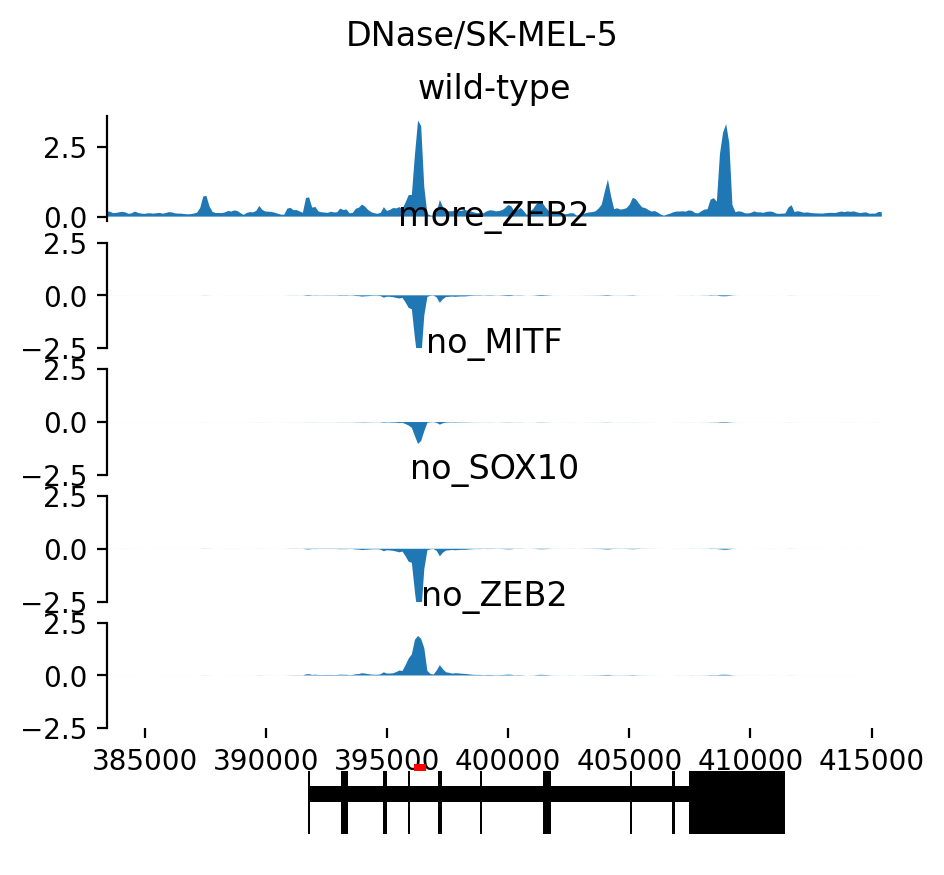

In [15]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

enformer_class = 162

n_tracks = 6
fig = plt.figure(figsize=(5,0.8*n_tracks))
fig.suptitle(enformer_classes[enformer_class])
ax  = fig.add_subplot(n_tracks,1,1)
values = predictions_irf4['wild-type'][447-100:447+150,enformer_class]
ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
ax.set_xticks([])
ax.set_title("wild-type")
ax.margins(x=0)

for i,key in enumerate(['more_ZEB2', 'no_MITF', 'no_SOX10', 'no_ZEB2']):
    ax = fig.add_subplot(n_tracks,1,i+2)
    values = predictions_irf4[key][447-100:447+150,enformer_class] - predictions_irf4['wild-type'][447-100:447+150,enformer_class] 
    ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
    ax.set_ylim(-2.5,2.5)
    ax.set_title(key)
    ax.margins(x=0)
    if i!=3:
        ax.set_xticks([])

sns.despine(top=True, right=True, bottom=True)

for ax_no in [6]:
    ax  = fig.add_subplot(n_tracks,1,ax_no)
    gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
    genes_in_window = set(gtf_region_intersect.gene_name)
    n_genes_in_window = len(genes_in_window)
    for idx, _gene in enumerate(genes_in_window):
        for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
            if part['Feature'] == 'exon':
                exon_start = part['Start']
                exon_end = part['End']
                rect = mpatches.Rectangle(
                    (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
            elif part['Feature'] == 'transcript':
                gene_start = part['Start']
                gene_end = part['End']
                rect = mpatches.Rectangle(
                    (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
   
    rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
    ax.add_patch(rect)
    ax.set_ylim([-2/1.2, 2/1.2])
    ax.set_xlim([start,end])
    sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.patch.set_alpha(0)
    
#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_DNase_IRF4Locus.pdf",transparent=True)

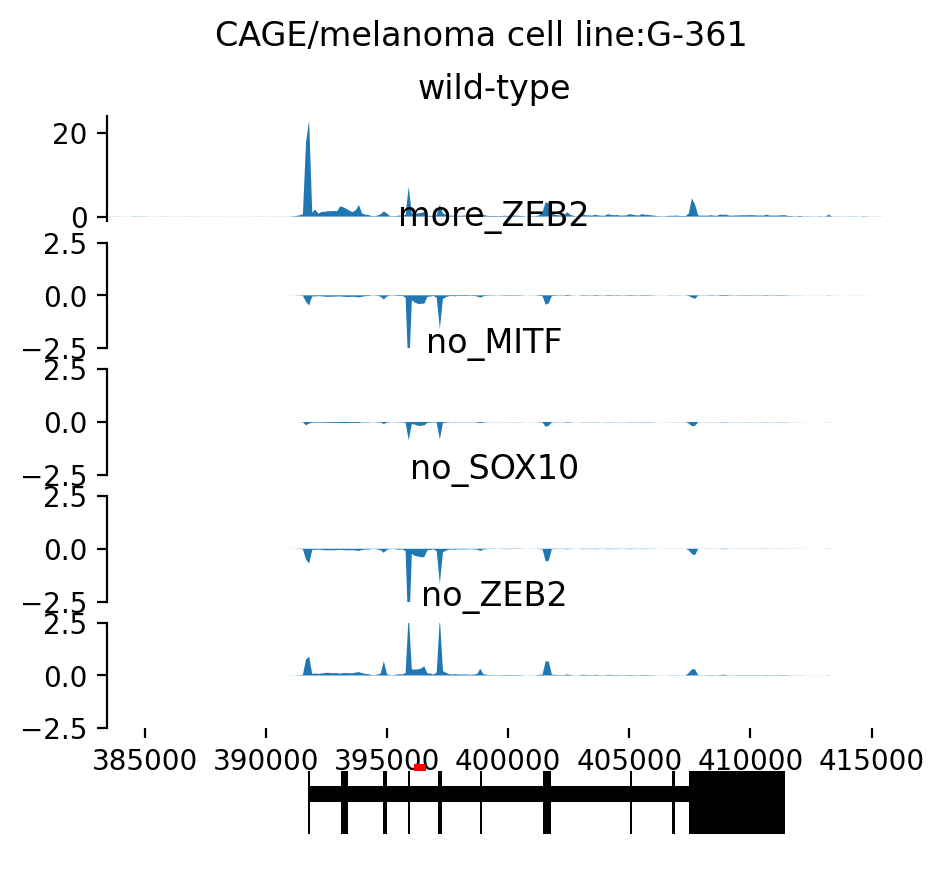

In [16]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

enformer_class = 4832

n_tracks = 6
fig = plt.figure(figsize=(5,0.8*n_tracks))
fig.suptitle(enformer_classes[enformer_class])
ax  = fig.add_subplot(n_tracks,1,1)
values = predictions_irf4['wild-type'][447-100:447+150,enformer_class]
ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
ax.set_xticks([])
ax.set_title("wild-type")
ax.margins(x=0)

for i,key in enumerate(['more_ZEB2', 'no_MITF', 'no_SOX10', 'no_ZEB2']):
    ax = fig.add_subplot(n_tracks,1,i+2)
    values = predictions_irf4[key][447-100:447+150,enformer_class] - predictions_irf4['wild-type'][447-100:447+150,enformer_class] 
    ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
    ax.set_ylim(-2.5,2.5)
    ax.set_title(key)
    ax.margins(x=0)
    if i!=3:
        ax.set_xticks([])

sns.despine(top=True, right=True, bottom=True)

for ax_no in [6]:
    ax  = fig.add_subplot(n_tracks,1,ax_no)
    gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
    genes_in_window = set(gtf_region_intersect.gene_name)
    n_genes_in_window = len(genes_in_window)
    for idx, _gene in enumerate(genes_in_window):
        for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
            if part['Feature'] == 'exon':
                exon_start = part['Start']
                exon_end = part['End']
                rect = mpatches.Rectangle(
                    (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
            elif part['Feature'] == 'transcript':
                gene_start = part['Start']
                gene_end = part['End']
                rect = mpatches.Rectangle(
                    (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
   
    rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
    ax.add_patch(rect)
    ax.set_ylim([-2/1.2, 2/1.2])
    ax.set_xlim([start,end])
    sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.patch.set_alpha(0)
    
#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_CAGE_IRF4Locus.pdf",transparent=True)

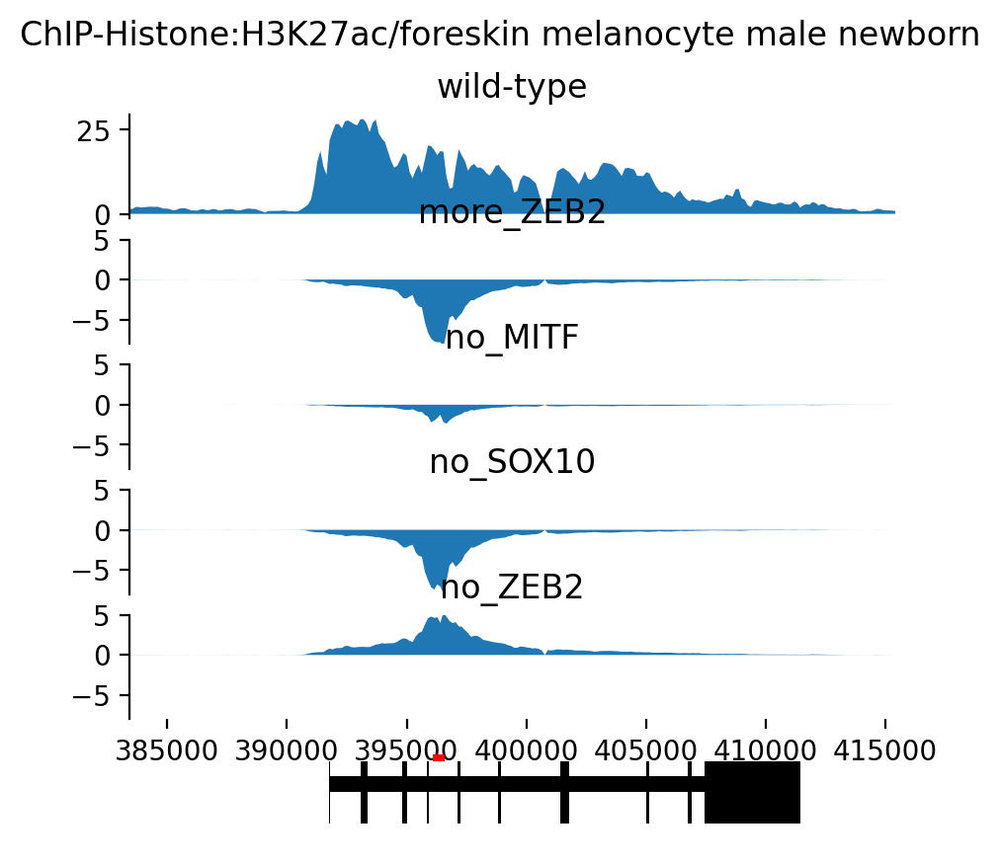

In [17]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

enformer_class = 2162

n_tracks = 6
fig = plt.figure(figsize=(5,0.8*n_tracks))
fig.suptitle(enformer_classes[enformer_class])
ax  = fig.add_subplot(n_tracks,1,1)
values = predictions_irf4['wild-type'][447-100:447+150,enformer_class]
ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
ax.set_xticks([])
ax.set_title("wild-type")
ax.margins(x=0)

for i,key in enumerate(['more_ZEB2', 'no_MITF', 'no_SOX10', 'no_ZEB2']):
    ax = fig.add_subplot(n_tracks,1,i+2)
    values = predictions_irf4[key][447-100:447+150,enformer_class] - predictions_irf4['wild-type'][447-100:447+150,enformer_class] 
    ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
    ax.set_ylim(-8,5)
    ax.set_title(key)
    ax.margins(x=0)
    if i!=3:
        ax.set_xticks([])

sns.despine(top=True, right=True, bottom=True)

for ax_no in [6]:
    ax  = fig.add_subplot(n_tracks,1,ax_no)
    gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
    genes_in_window = set(gtf_region_intersect.gene_name)
    n_genes_in_window = len(genes_in_window)
    for idx, _gene in enumerate(genes_in_window):
        for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
            if part['Feature'] == 'exon':
                exon_start = part['Start']
                exon_end = part['End']
                rect = mpatches.Rectangle(
                    (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
            elif part['Feature'] == 'transcript':
                gene_start = part['Start']
                gene_end = part['End']
                rect = mpatches.Rectangle(
                    (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                ax.add_patch(rect)
   
    rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
    ax.add_patch(rect)
    ax.set_ylim([-2/1.2, 2/1.2])
    ax.set_xlim([start,end])
    sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.patch.set_alpha(0)
    
#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_IRF4_mutations_prediction_H3K27ac_IRF4Locus.pdf",transparent=True)

### Loading the generated sequences via in silico evolution

In [13]:
import pickle
f = open("data/deepmel2/MM_EFS_4000_withmut.pkl", "rb")
evolved_seq_4000_dict = pickle.load(f)
f.close()

nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

### Calculating the Enformer prediction scores on the synthetic enhancers (generated by in silico evolution) at different mutational and repression steps
### The synthetic sequence is replaced with the IRF4 enhancer

In [22]:
# nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

# predictions_irf4_efs = {}
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh, end=": ")
#     predictions_irf4_efs[genomic_enh] = {}
#     for id_ in [15,17,19,22,27,45,49,60,68,72]:
#         print(id_, end=', ')
#         predictions_irf4_efs[genomic_enh][id_] = []
#         start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#         predictions_irf4_efs[genomic_enh][id_].append(pred_3bp(sequence_one_hot_i[genomic_enh],start_x[0]))
#         for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#             start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#             predictions_irf4_efs[genomic_enh][id_].append(pred_3bp(sequence_one_hot_i[genomic_enh],start_x[0]))            
#     print("")
    
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh)

#     id_ = 22
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs[genomic_enh][id_].append(pred_3bp(sequence_one_hot_i[genomic_enh],start_x[0]))

#     id_ = 15
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs[genomic_enh][id_].append(pred_3bp(sequence_one_hot_i[genomic_enh],start_x[0]))

#     id_ = 60
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs[genomic_enh][id_].append(pred_3bp(sequence_one_hot_i[genomic_enh],start_x[0]))
    
# import pickle
# f = open("data/enformer/predictions_irf4_efs.pkl", "wb")
# pickle.dump(predictions_irf4_efs, f ,protocol=4)
# f.close()

In [15]:
import pickle
f = open("data/enformer/predictions_irf4_efs.pkl", "rb")
predictions_irf4_efs = pickle.load(f)
f.close()

### Plotting Enformer prediction scores on the synthetic enhancers (generated by in silico evolution) at different mutational and repression steps

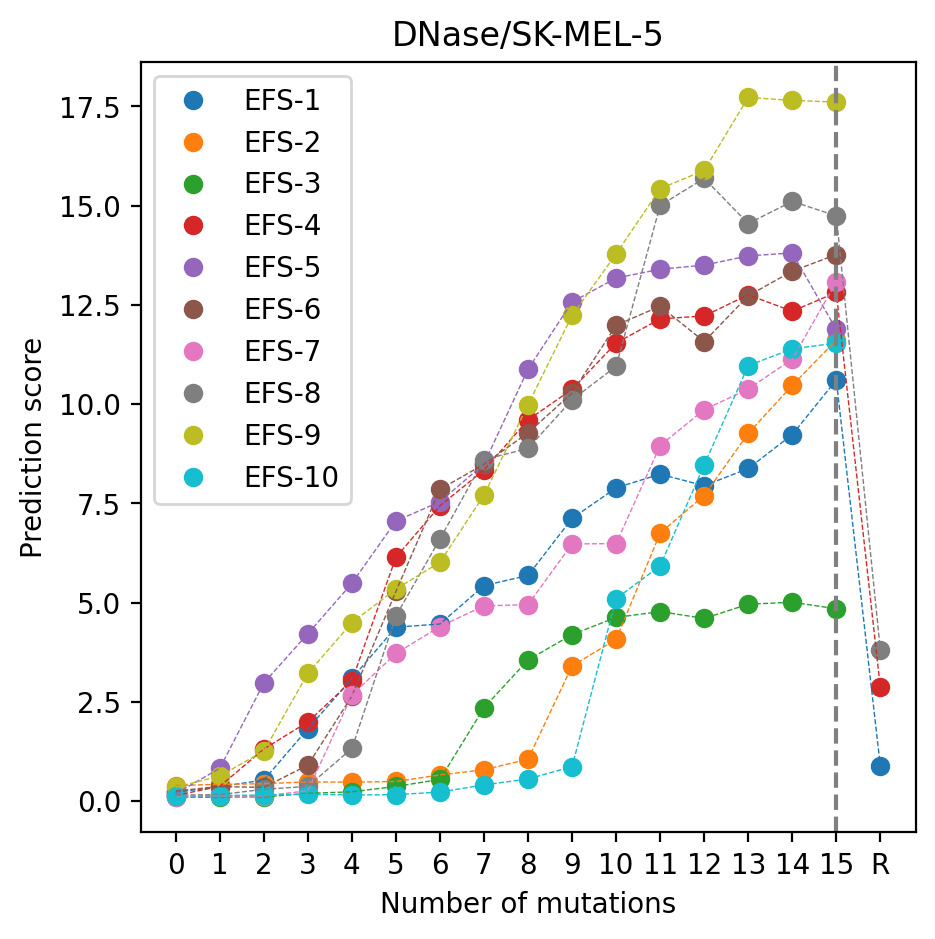

In [24]:
genomic_enh = 'irf4_locus'
enformer_class = 162
plt.figure(figsize=(5,5))
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.title(enformer_classes[enformer_class])
plt.savefig("figures/enformer/EFS_SelectedSeqs_Prediction_DNase.pdf",transparent=True)

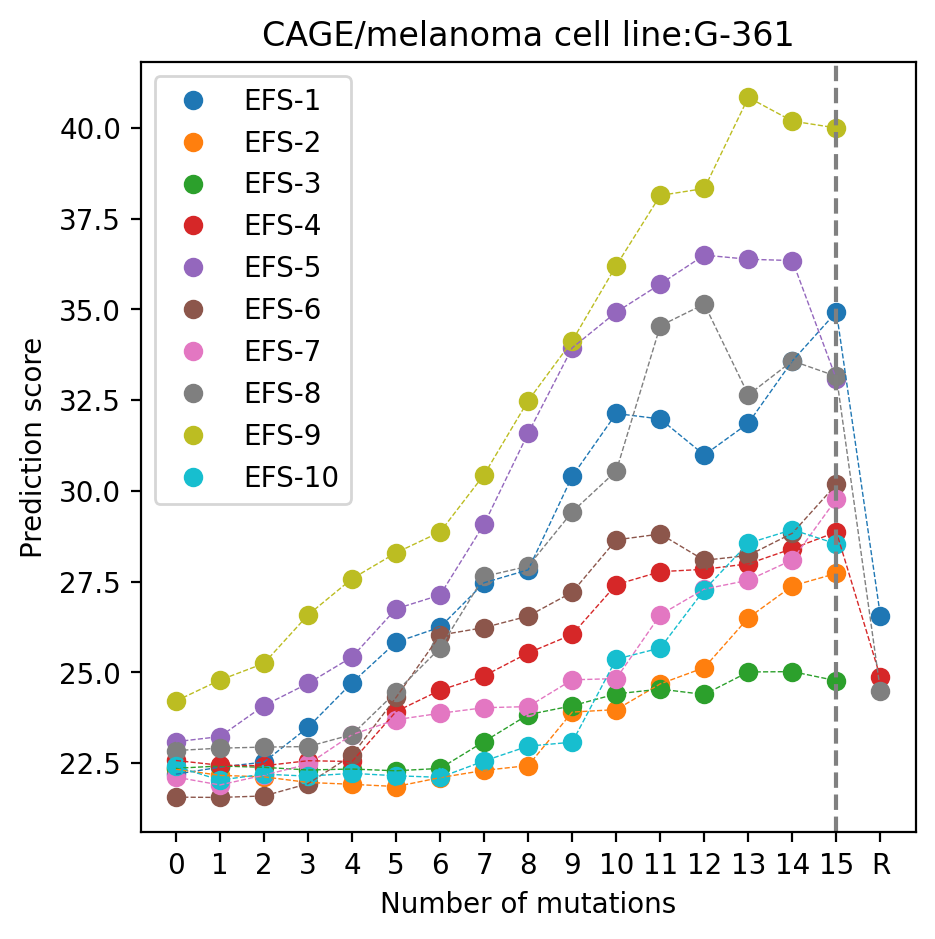

In [25]:
genomic_enh = 'irf4_locus'
enformer_class = 4832
plt.figure(figsize=(5,5))
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,412,enformer_class].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,412,enformer_class].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.title(enformer_classes[enformer_class])
plt.savefig("figures/enformer/EFS_SelectedSeqs_Prediction_CAGE.pdf",transparent=True)

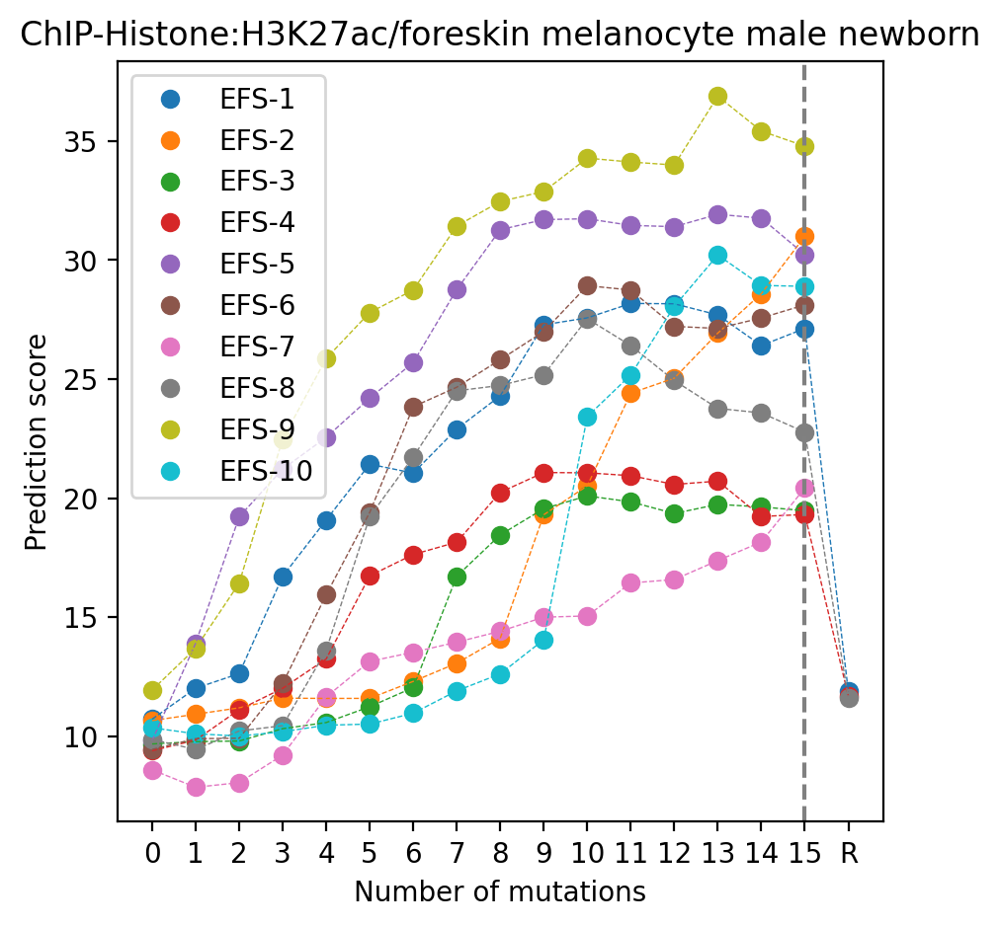

In [26]:
genomic_enh = 'irf4_locus'
enformer_class = 2162
plt.figure(figsize=(5,5))
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.title(enformer_classes[enformer_class])
plt.savefig("figures/enformer/EFS_SelectedSeqs_Prediction_H3K27ac.pdf",transparent=True)

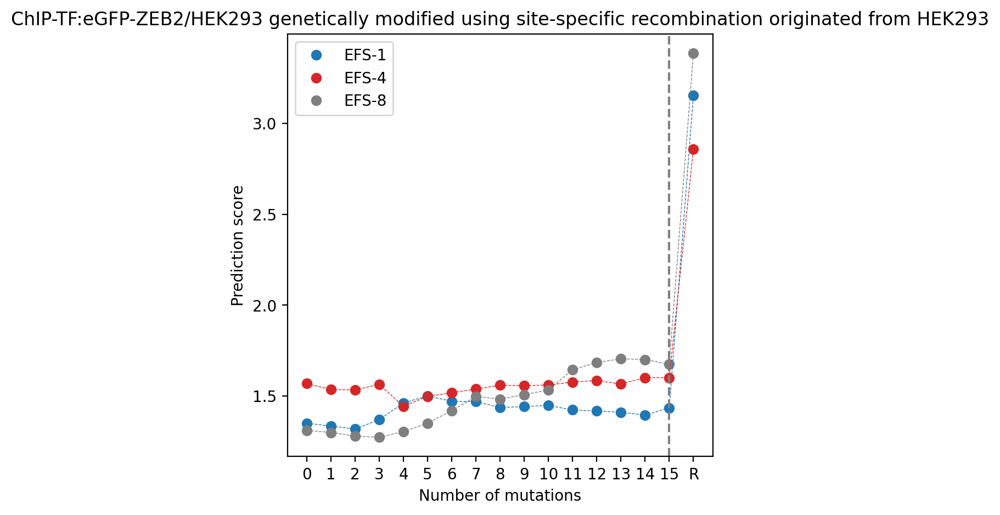

In [27]:
genomic_enh = 'irf4_locus'
enformer_class = 2719
plt.figure(figsize=(5,5))
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    if id_ in [22,15,60]:
        _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="",marker="o",color="C"+str(k))
plt.legend()
for k,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    if id_ in [22,15,60]:
        _ = plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,enformer_class].T,label="EFS-"+str(k+1),linestyle="--",linewidth=0.5,color="C"+str(k))
_ = plt.xticks(range(17),list(range(16))+["R"])
plt.axvline(x=15,linestyle="--",color="gray")
plt.xlabel("Number of mutations")
plt.ylabel("Prediction score")
plt.title(enformer_classes[enformer_class])
plt.savefig("figures/enformer/EFS_SelectedSeqs_Prediction_ZEB2.pdf",transparent=True)

### Plotting all Enformer DNase prediction scores on the synthetic enhancers

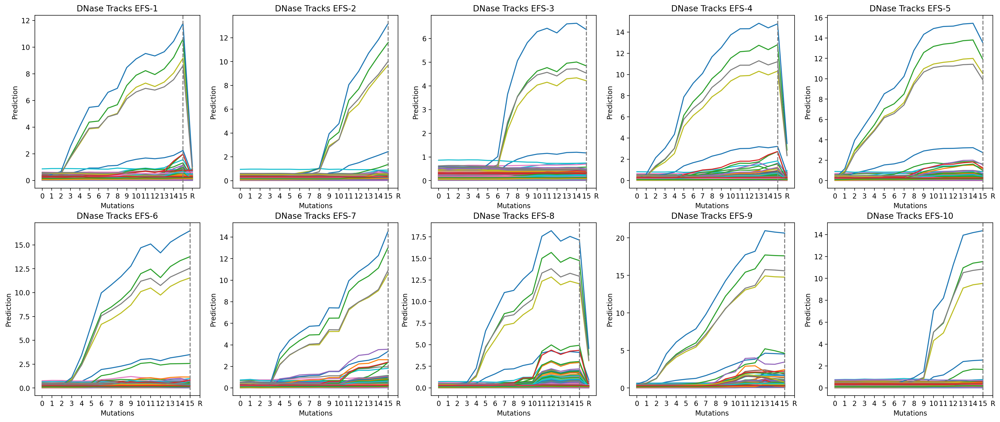

In [28]:
fig = plt.figure(figsize=(25,10))
genomic_enh = 'irf4_locus'
for i,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    ax = fig.add_subplot(2,5,i+1)
    plt.plot(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,:674])
    plt.title('DNase Tracks '+ "EFS-"+str(i+1))
    plt.xlabel('Mutations')
    plt.ylabel('Prediction')
    plt.xticks(range(17),list(range(16))+["R"])
    plt.axvline(x=15,linestyle="--",color="gray")
plt.savefig("figures/enformer/EFS_SelectedSeqs_AllDNaseClasses.pdf",transparent=True)

### Plotting top 50 Enformer DNase prediction scores on the synthetic enhancers

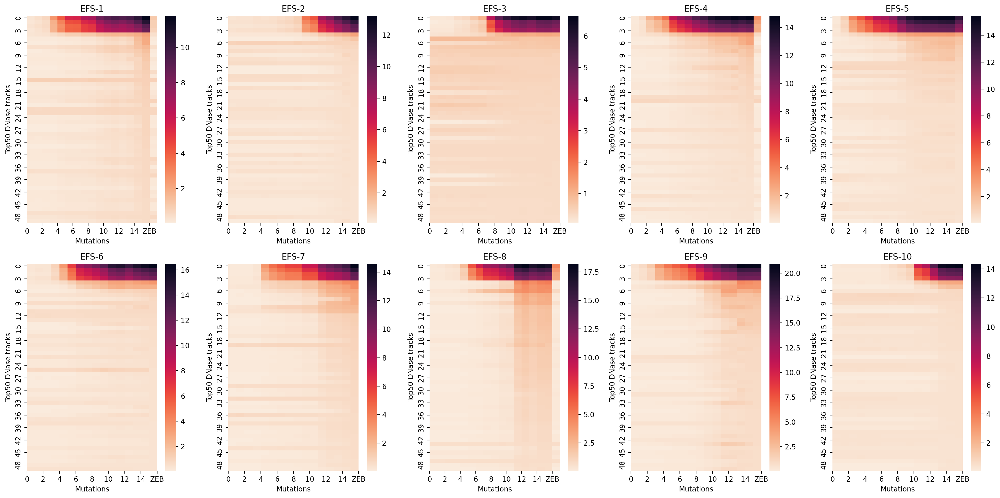

In [29]:
fig = plt.figure(figsize=(20,10))
for i,id_ in enumerate([15,17,19,22,27,45,49,60,68,72]):
    ax = fig.add_subplot(2,5,i+1)
    sns.heatmap(np.array(predictions_irf4_efs[genomic_enh][id_])[:,447,:674].T[np.argsort(np.array(predictions_irf4_efs[genomic_enh][id_])[15,447,:674])[::-1]][:50],cmap='rocket_r')
    plt.ylabel("Top50 DNase tracks")
    plt.xlabel("Mutations")
    plt.title('EFS-'+str(i+1))
    _ = plt.xticks(range(0,17,2),[0,2,4,6,8,10,12,14,"ZEB"])
fig.tight_layout()
plt.savefig("figures/enformer/EFS_SelectedSeqs_AllDNaseClasses_heatmap.pdf",transparent=True)

### Printing the top 4 DNase tracks that have highest prediction scores

In [20]:
genomic_enh = 'irf4_locus'
id_ = 15
for i in np.argsort(np.array(predictions_irf4_efs[genomic_enh][id_])[15,447,:673])[::-1][:5]:
    print(i,enformer_classes[i],np.array(predictions_irf4_efs[genomic_enh][id_])[15,447,i])

380 DNase/foreskin melanocyte male newborn 11.784312
162 DNase/SK-MEL-5 10.606849
168 DNase/SK-MEL-5 9.169678
427 DNase/foreskin melanocyte male newborn 8.603679
40 DNase/epidermal melanocyte 2.25644


### Plotting DNase, CAGE, and H3K27ac prediction scores on synthetic enhancers at different mutational and repressed steps

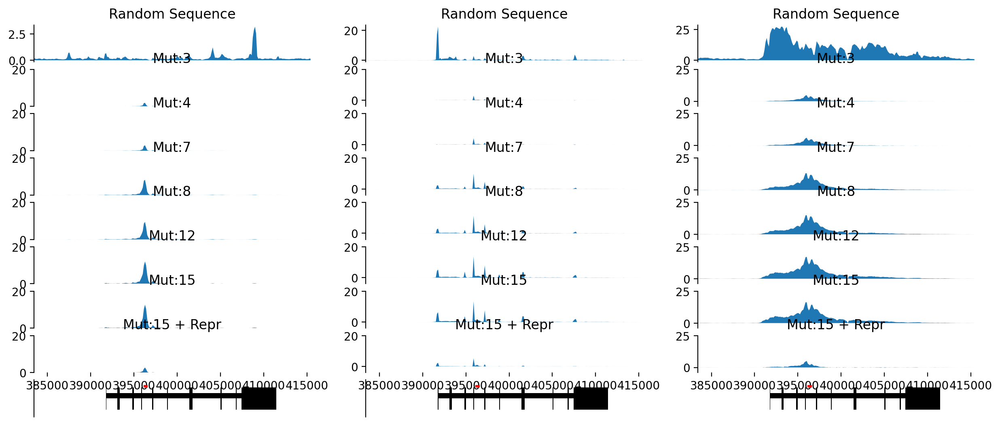

In [47]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x, [id_,enformer_class,title_,name_,ymin_,y_max,muts] in enumerate([[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],#[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],#[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],#[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_EFS4_IRF4Locus.pdf",transparent=True)
    

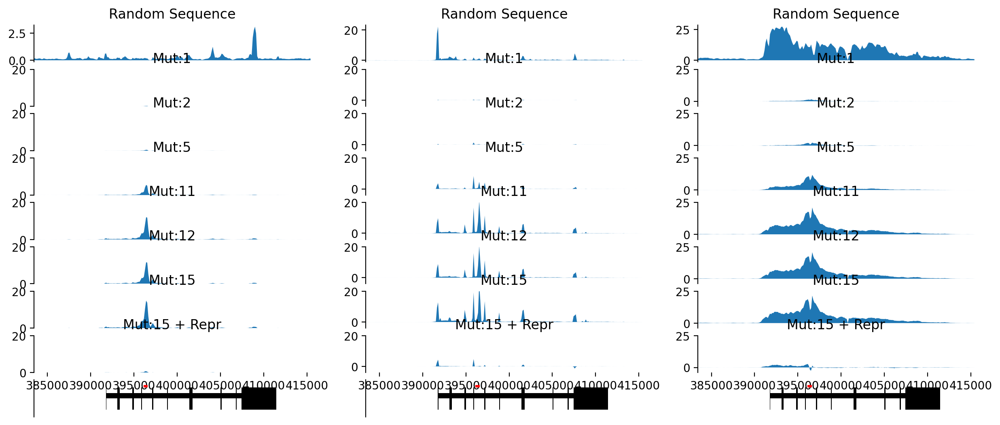

In [48]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x, [id_,enformer_class,title_,name_,ymin_,y_max,muts] in enumerate([[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],#[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],#[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],#[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_EFS1_IRF4Locus.pdf",transparent=True)
    

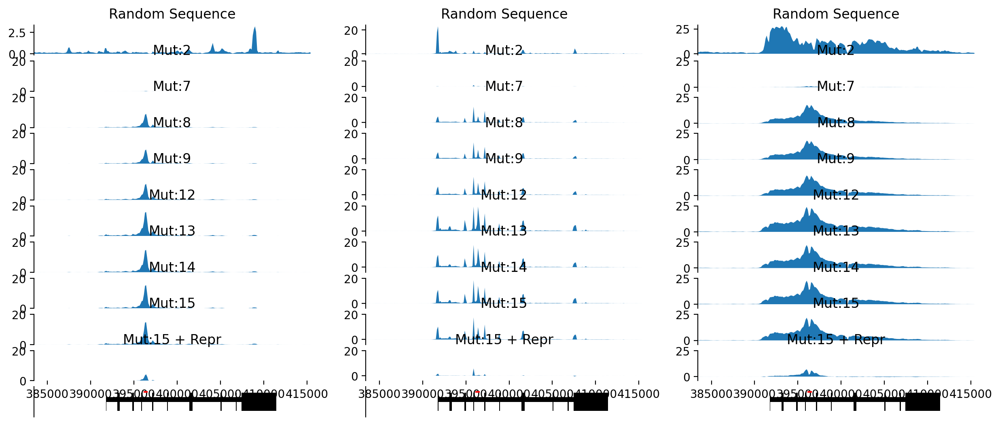

In [49]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x, [id_,enformer_class,title_,name_,ymin_,y_max,muts] in enumerate([[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

#fig.tight_layout()
plt.savefig("figures/enformer/Enformer_EFS8_IRF4Locus.pdf",transparent=True)
    

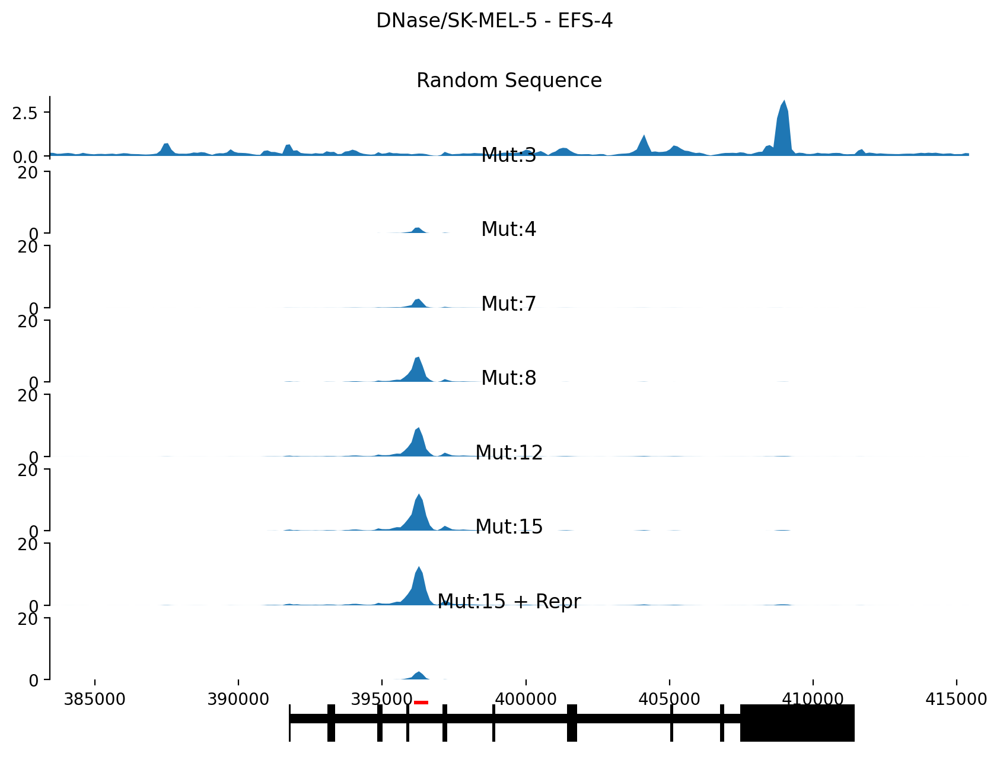

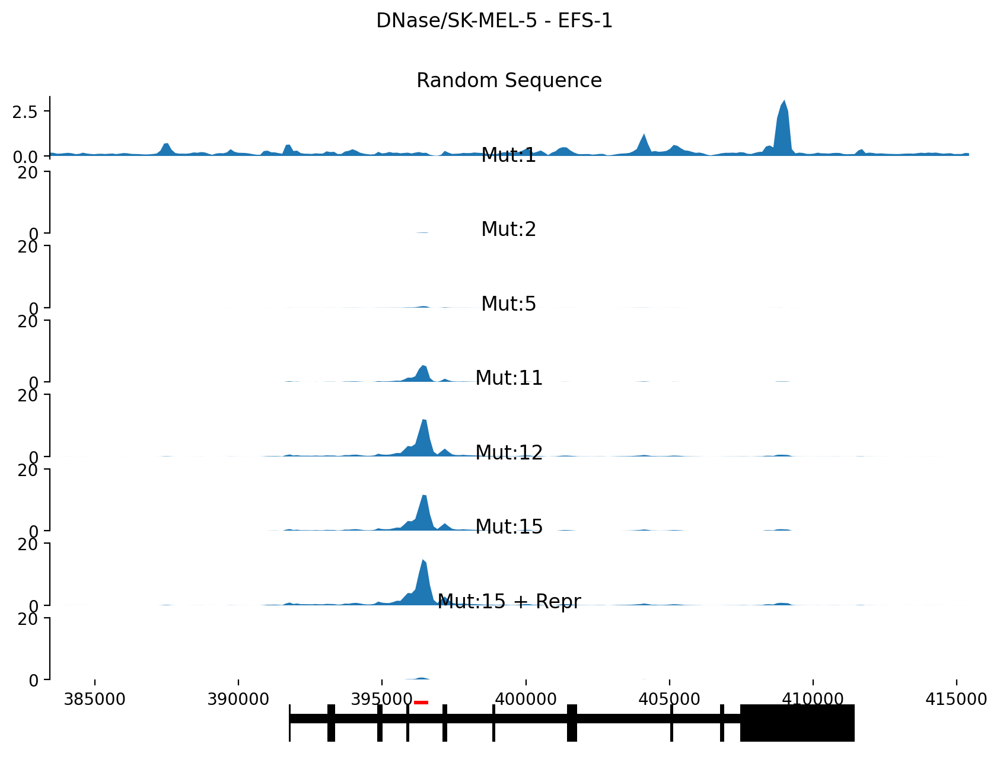

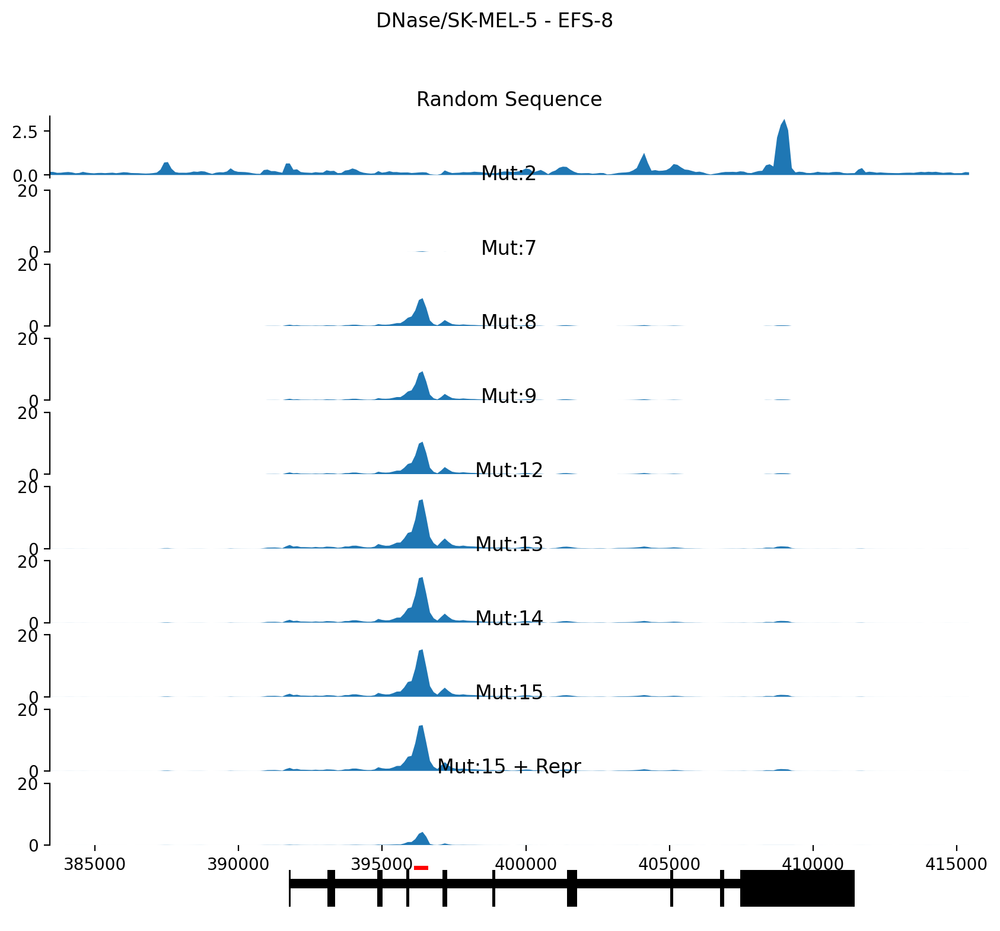

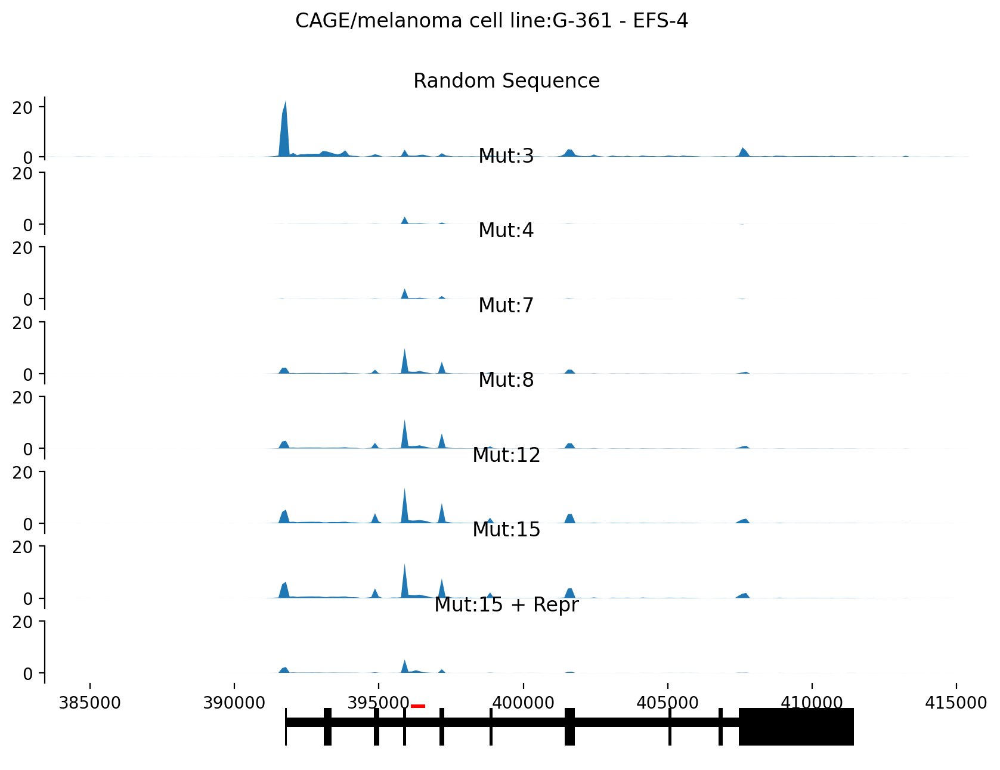

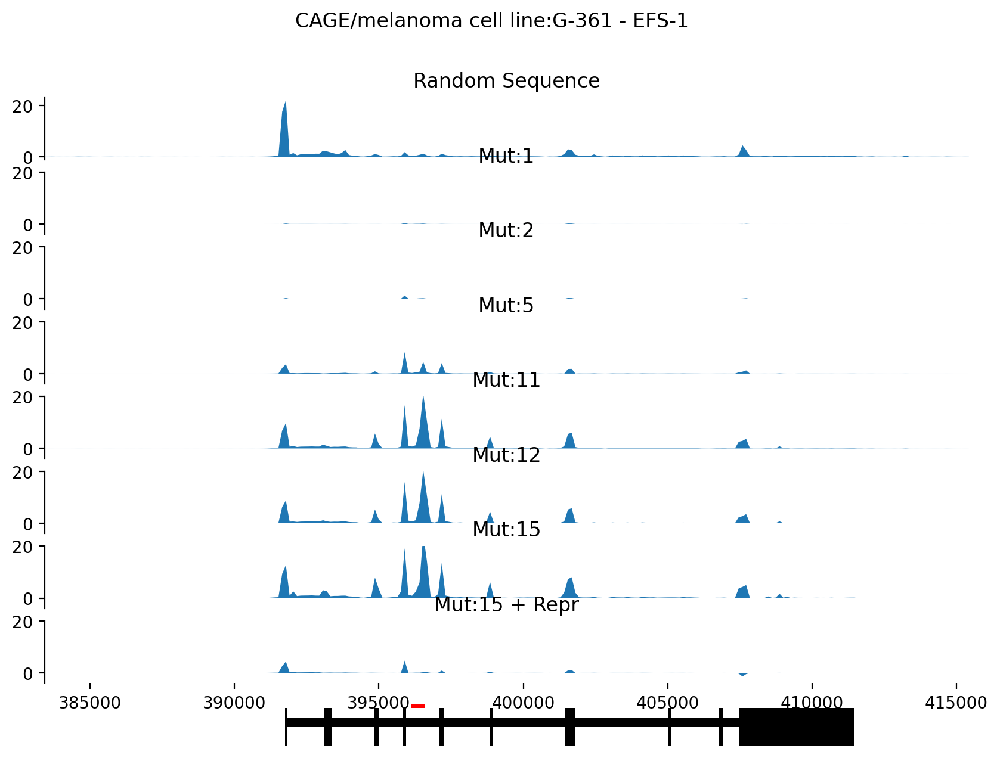

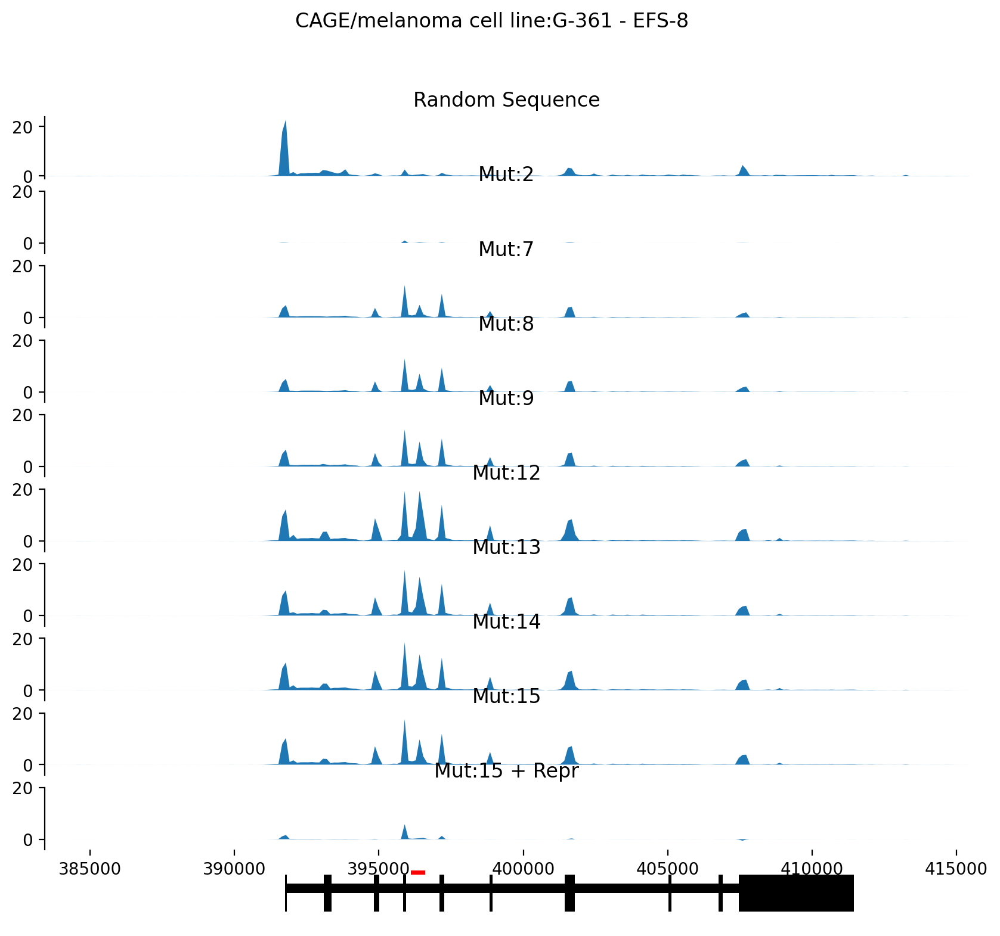

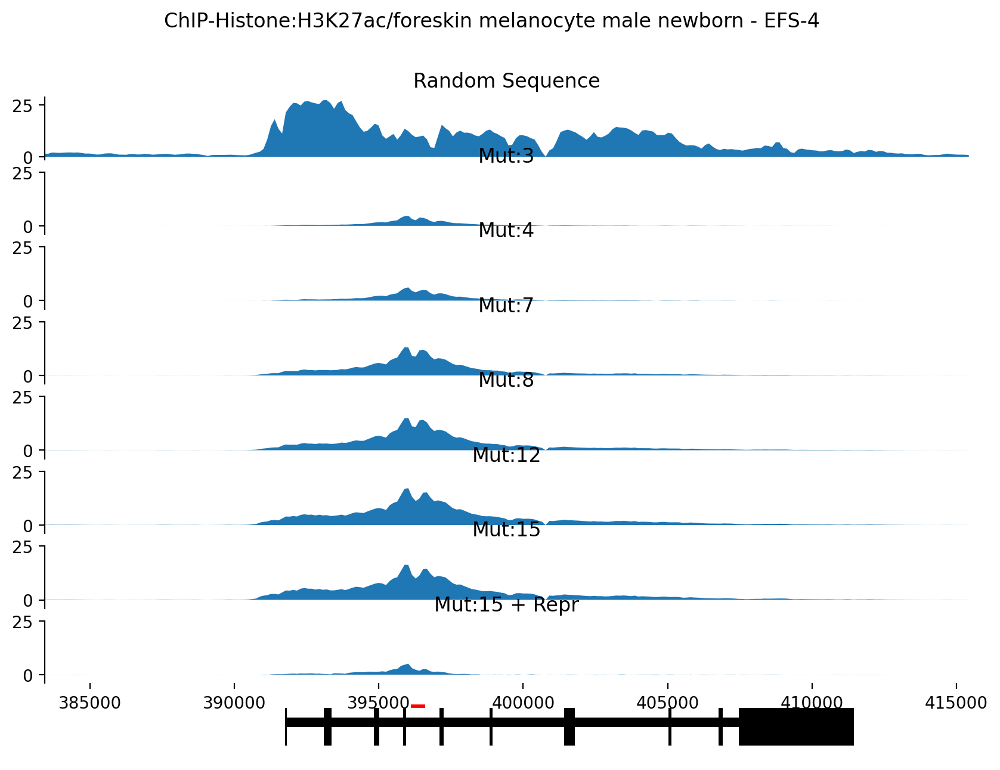

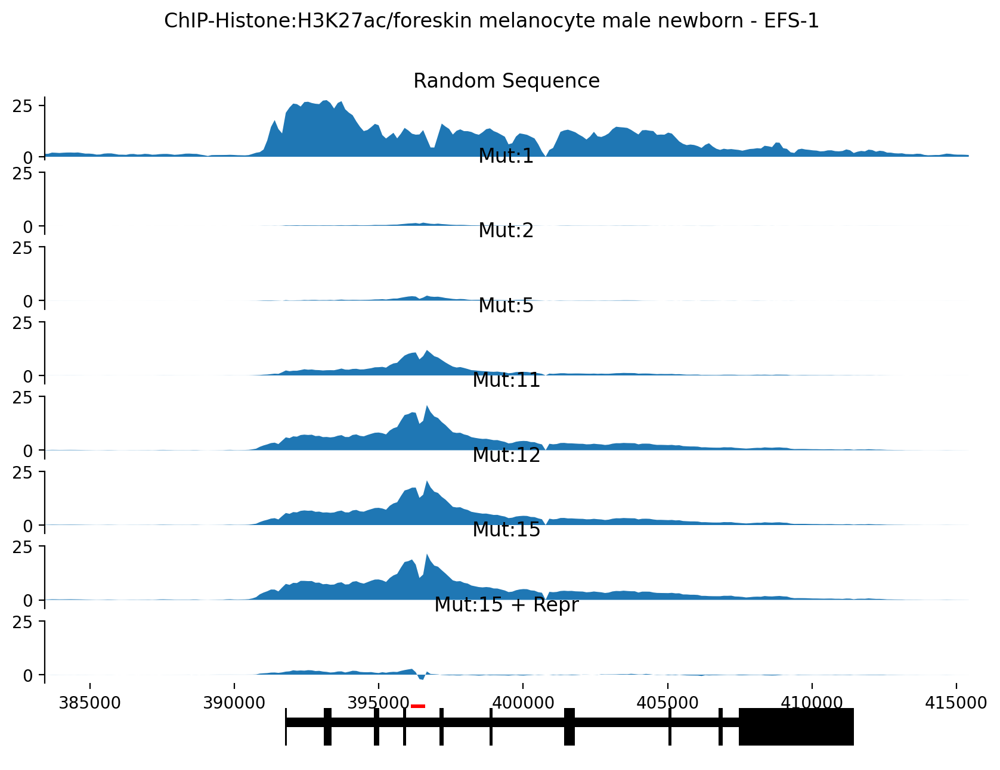

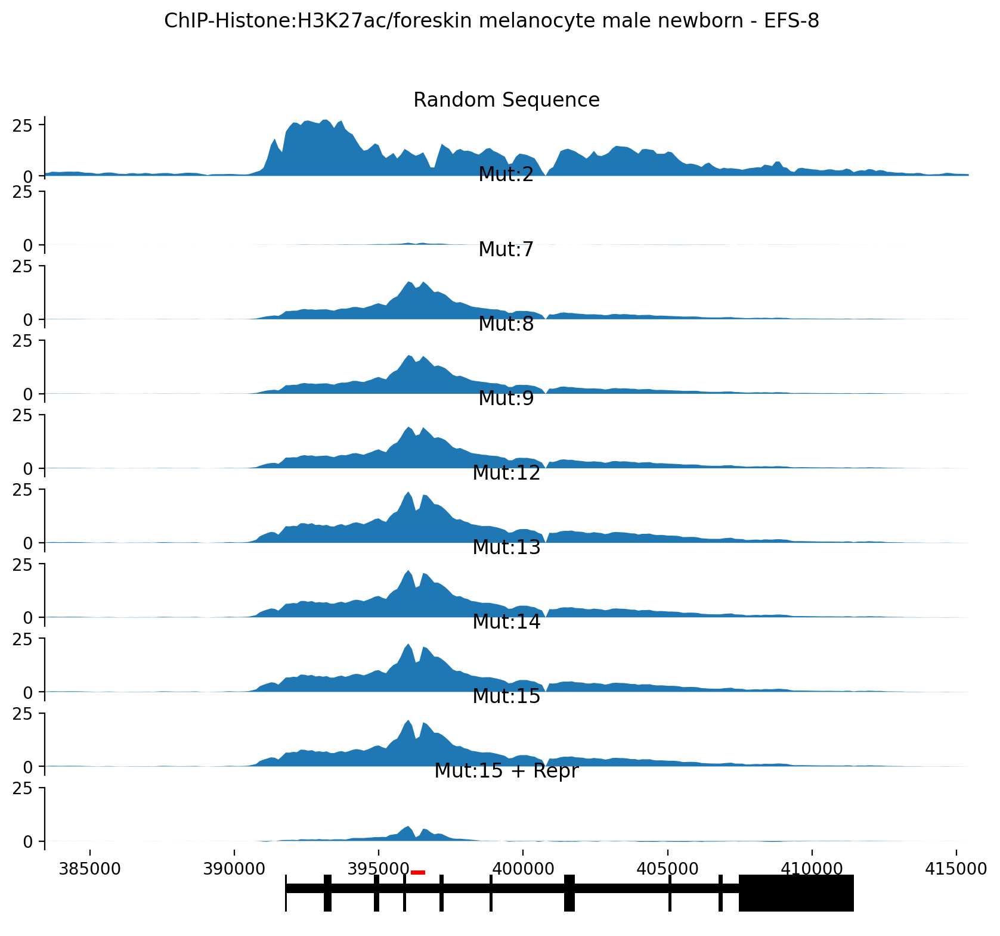

In [31]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

for id_,enformer_class,title_,name_,ymin_,y_max,muts in [[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]]:
    n_tracks = len(muts)+2
    fig = plt.figure(figsize=(10,0.8*n_tracks))
    fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,1,1)
    values = np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,1,i+2)
        values = np.array(predictions_irf4_efs[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [n_tracks]:
        ax  = fig.add_subplot(n_tracks,1,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
    plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_"+title_+"_IRF4Locus.pdf",transparent=True)
    

### Function that scores the sequences 3 times by shifting 1bp upstream and 1bp downstream
### It also takes shift and inserted sequence parameters as input and embeds the sequence to the shift location

In [32]:
def pred_3bp_shift(main_seq, inserted_seq, shift, species='human'):
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196357+shift:196357+shift+500,:] = inserted_seq
    pred_l = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196358+shift:196358+shift+500,:] = inserted_seq
    pred_m = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    modified_sequence_one_hot = np.copy(main_seq)
    modified_sequence_one_hot[196359+shift:196359+shift+500,:] = inserted_seq
    pred_r = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]
    return np.mean((pred_l,pred_m,pred_r),axis=0)

### Calculating the Enformer prediction scores on the synthetic enhancers that are shifted 5kb upstream, 10kb upstream, or 17.5kb downstream from their original location (position of the IRF4 enhancer)

In [33]:
# nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

# predictions_irf4_efs_5kUp = {}
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh, end=": ")
#     predictions_irf4_efs_5kUp[genomic_enh] = {}
#     for id_ in [15,22,60]:
#         print(id_, end=', ')
#         predictions_irf4_efs_5kUp[genomic_enh][id_] = []
#         start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#         predictions_irf4_efs_5kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-5000))
#         for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#             start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#             predictions_irf4_efs_5kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-5000))            
#     print("")
    
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh)

#     id_ = 22
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_5kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-5000))

#     id_ = 15
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_5kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-5000))

#     id_ = 60
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_5kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-5000))
    
# import pickle
# f = open("data/enformer/predictions_irf4_efs_5kUp.pkl", "wb")
# pickle.dump(predictions_irf4_efs_5kUp, f ,protocol=4)
# f.close()

irf4_locus: 15, 22, 60, 
irf4_locus


### Loading and plotting prediction scores where the synthetic enhancers are moved around the TSS of the irf4 gene

In [50]:
import pickle
f = open("data/enformer/predictions_irf4_efs_5kUp.pkl", "rb")
predictions_irf4_efs_5kUp = pickle.load(f)
f.close()

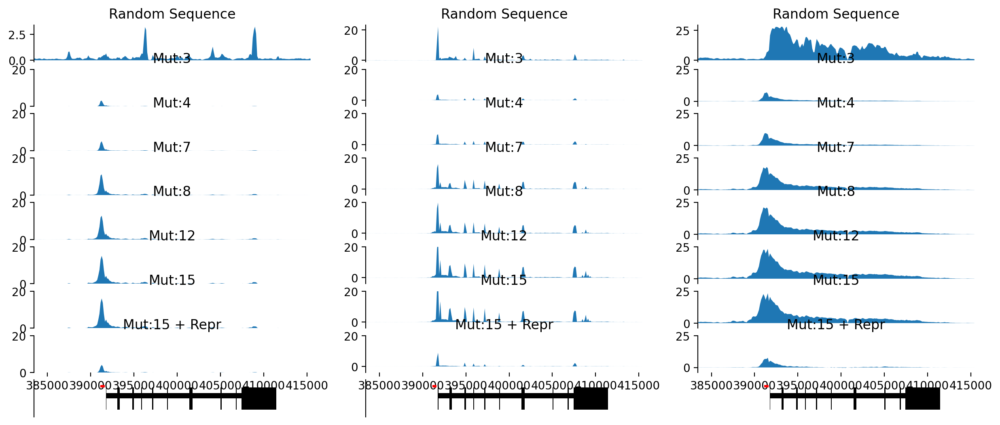

In [62]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x,[id_,enformer_class,title_,name_,ymin_,y_max,muts] in  enumerate([[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],#[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],#[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],#[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106-5000, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_IRF4Locus_5kbUp.pdf",transparent=True)
    

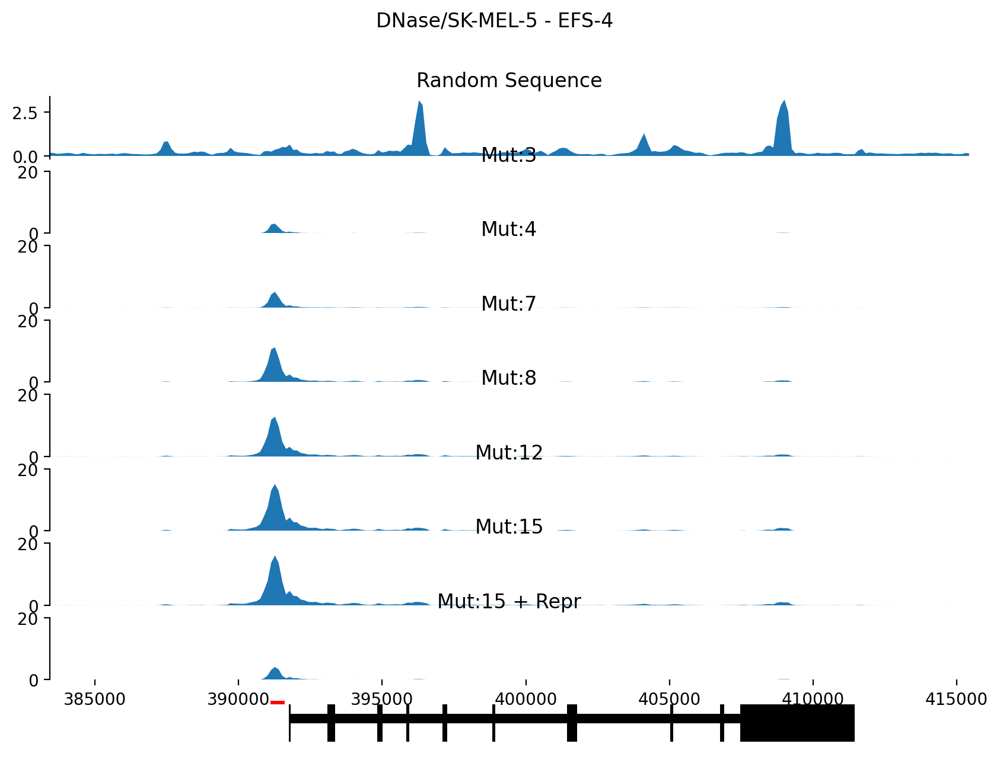

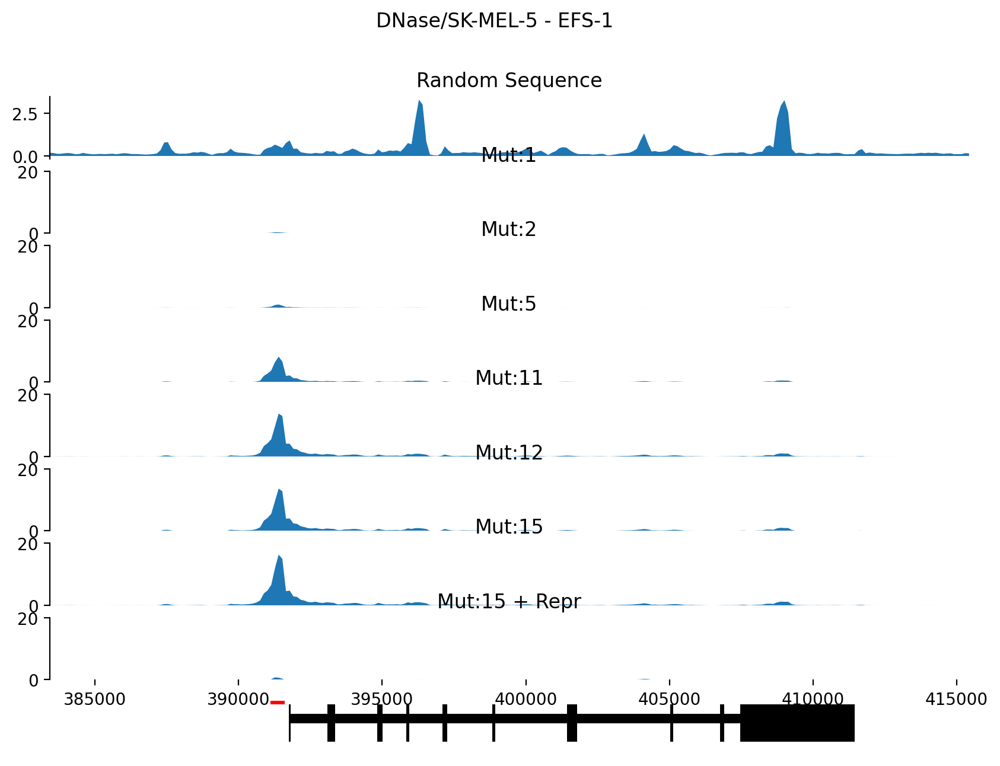

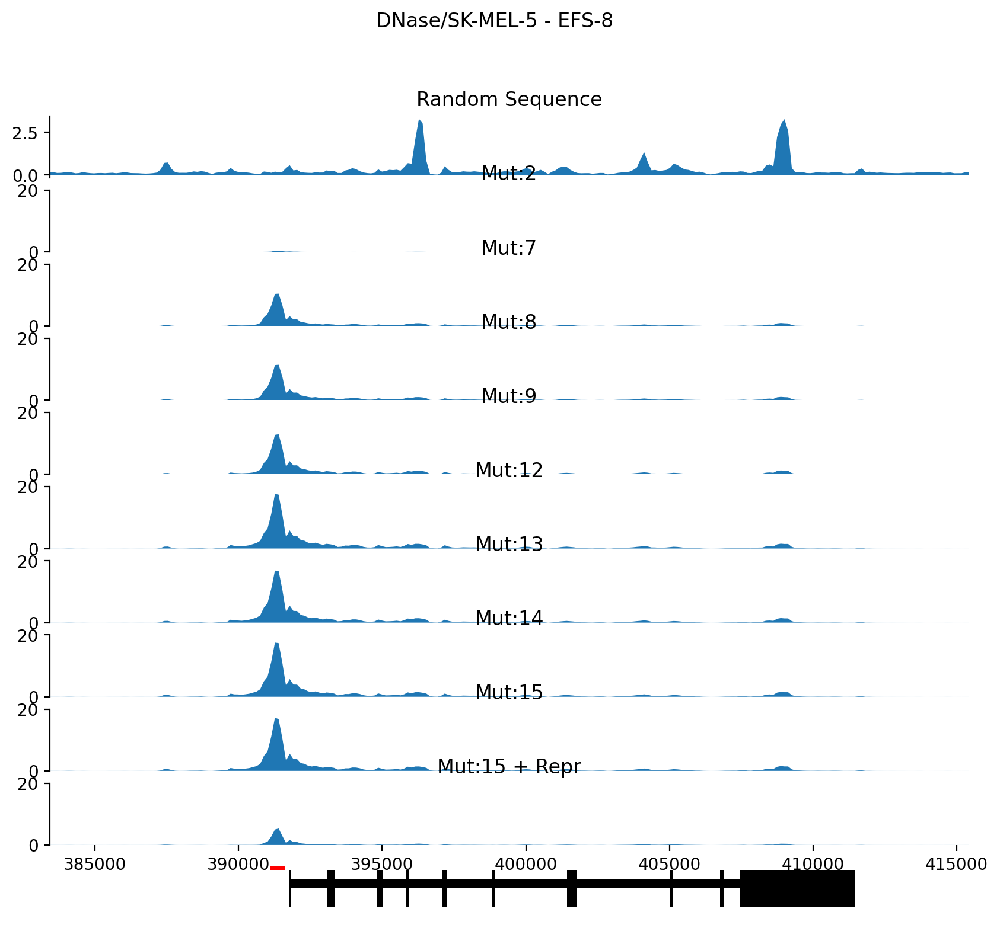

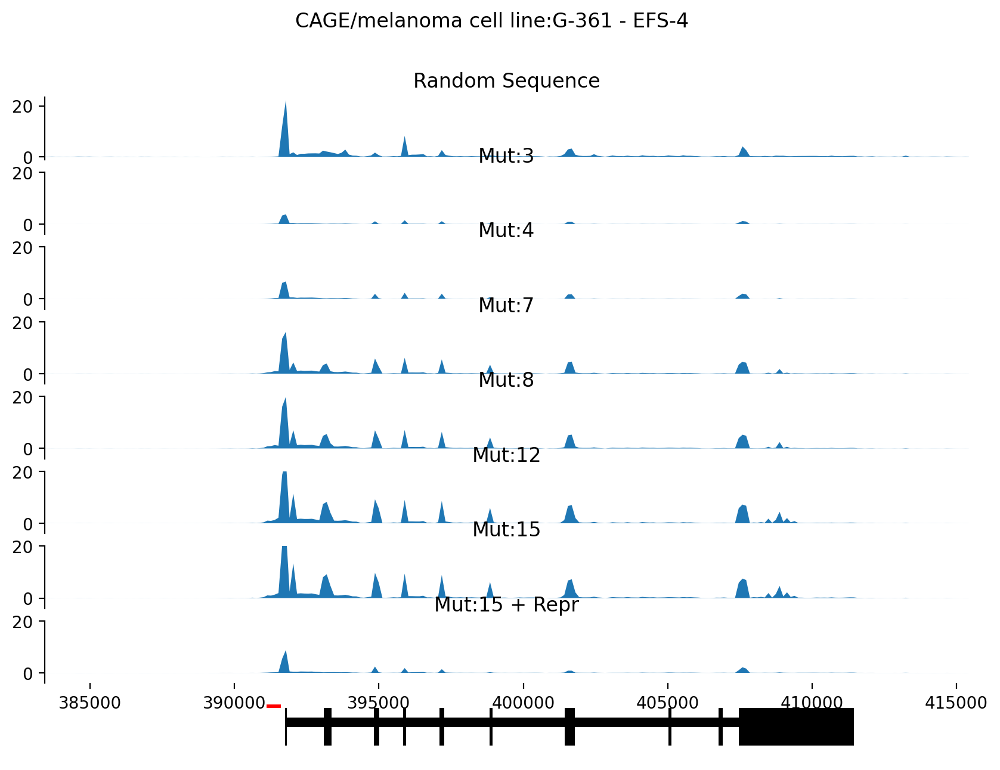

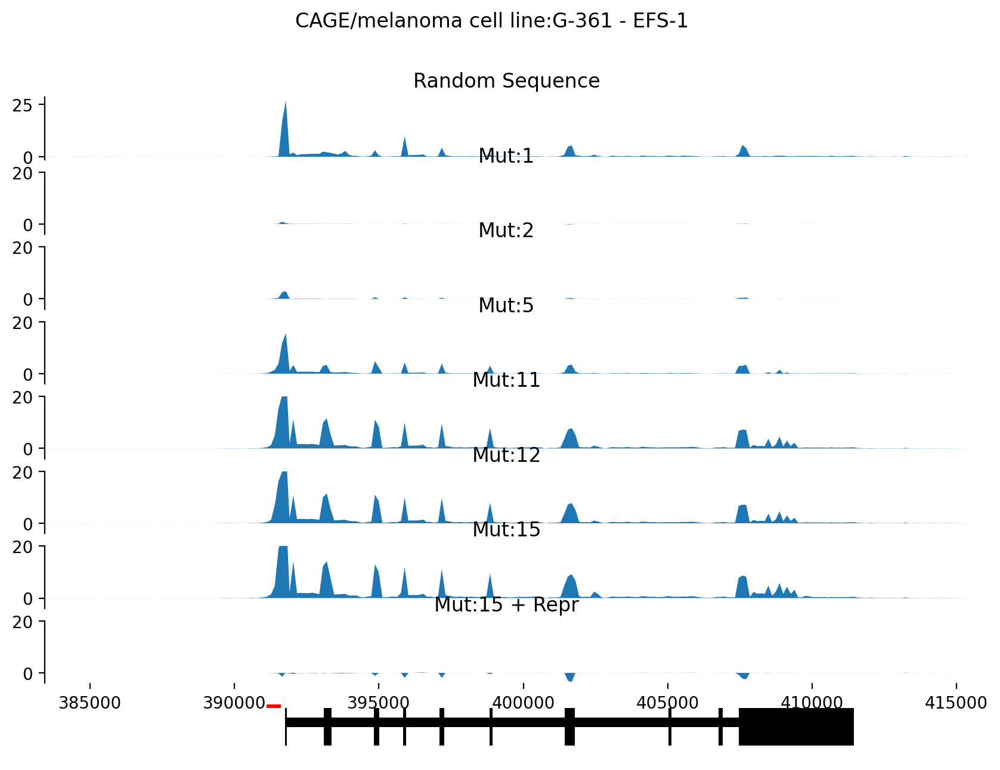

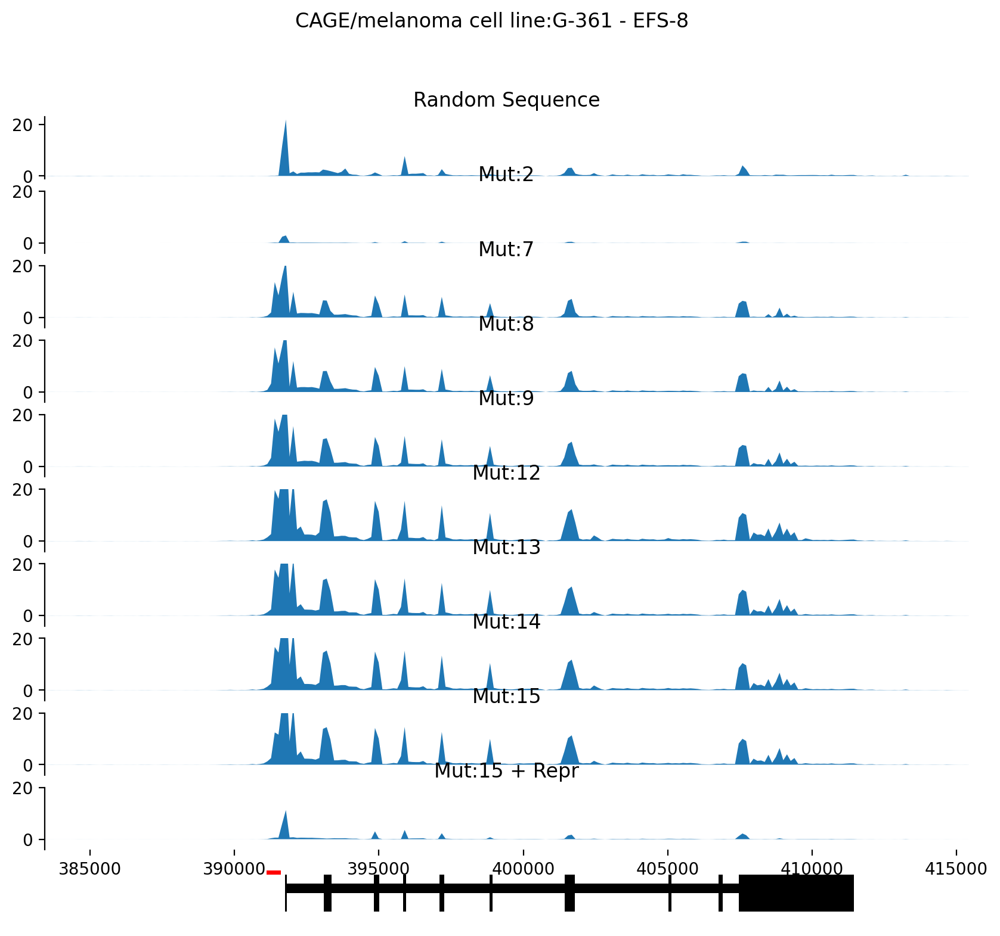

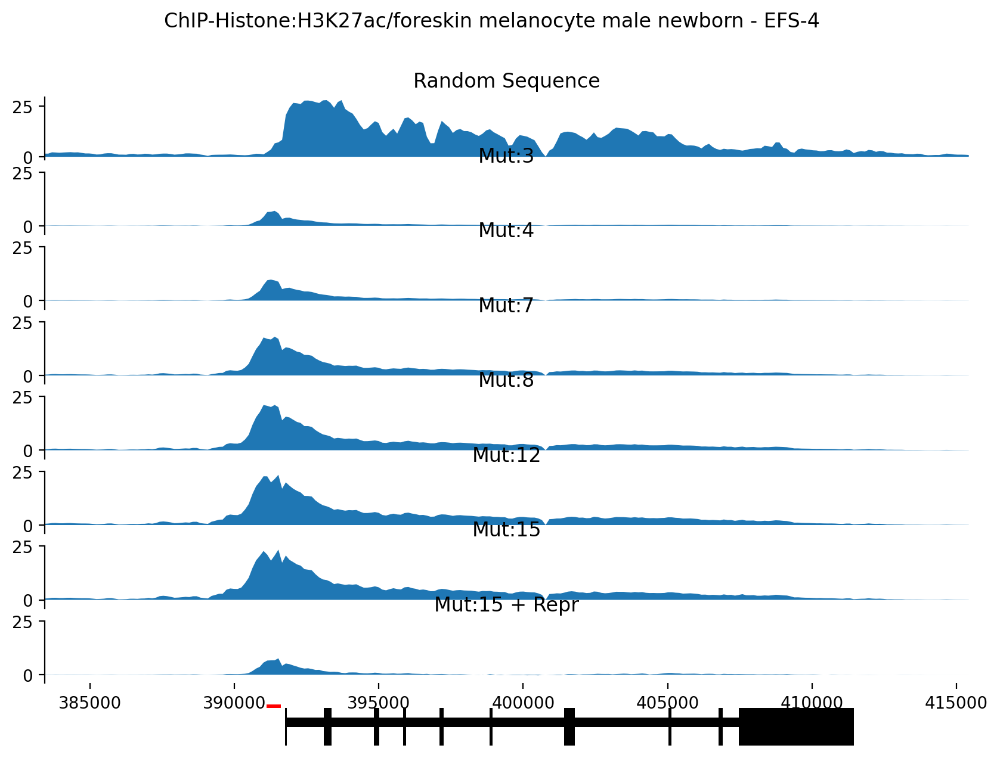

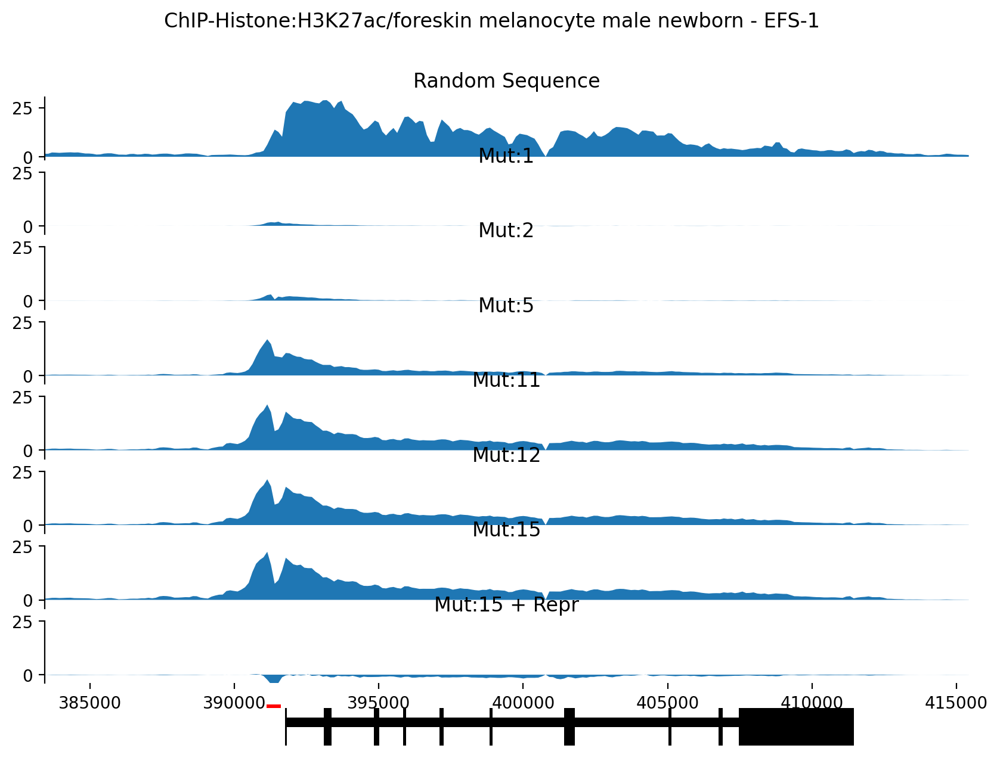

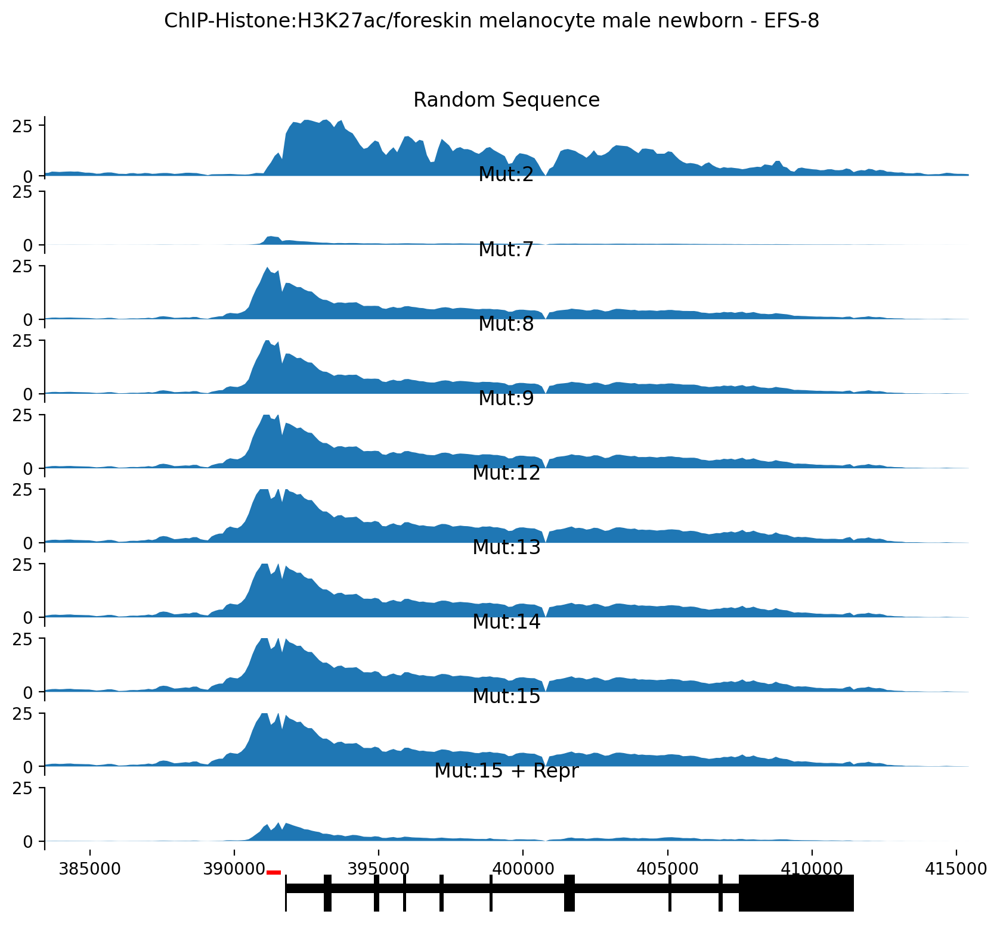

In [34]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

for id_,enformer_class,title_,name_,ymin_,y_max,muts in [[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]]:
    n_tracks = len(muts)+2
    fig = plt.figure(figsize=(10,0.8*n_tracks))
    fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,1,1)
    values = np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,1,i+2)
        values = np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_5kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [n_tracks]:
        ax  = fig.add_subplot(n_tracks,1,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106-5000, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
    plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_"+title_+"_IRF4Locus_5kbUp.pdf",transparent=True)
    

In [35]:
# nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

# predictions_irf4_efs_17500bpDown = {}
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh, end=": ")
#     predictions_irf4_efs_17500bpDown[genomic_enh] = {}
#     for id_ in [15,22,60]:
#         print(id_, end=', ')
#         predictions_irf4_efs_17500bpDown[genomic_enh][id_] = []
#         start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#         predictions_irf4_efs_17500bpDown[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=17500))
#         for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#             start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#             predictions_irf4_efs_17500bpDown[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=17500))            
#     print("")
    
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh)

#     id_ = 22
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_17500bpDown[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=17500))

#     id_ = 15
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_17500bpDown[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=17500))

#     id_ = 60
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_17500bpDown[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=17500))
    
# import pickle
# f = open("data/enformer/predictions_irf4_efs_17500bpDown.pkl", "wb")
# pickle.dump(predictions_irf4_efs_17500bpDown, f ,protocol=4)
# f.close()

irf4_locus: 15, 22, 60, 
irf4_locus


In [54]:
import pickle
f = open("data/enformer/predictions_irf4_efs_17500bpDown.pkl", "rb")
predictions_irf4_efs_17500bpDown = pickle.load(f)
f.close()

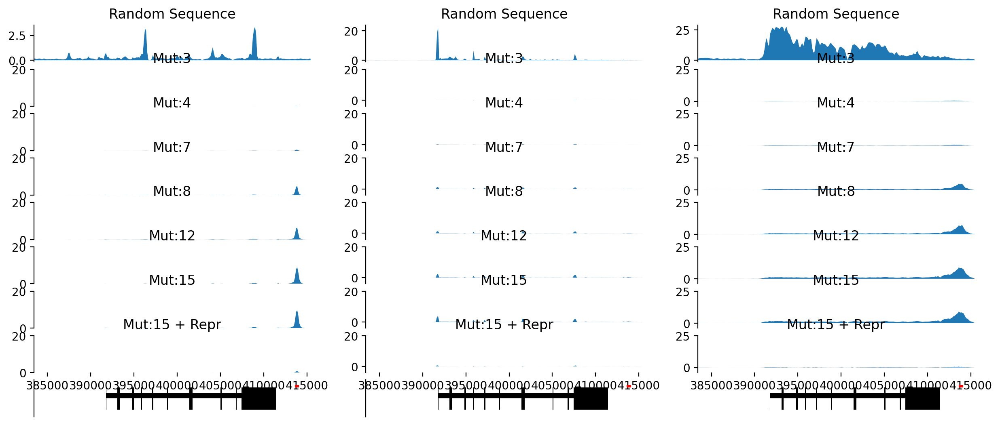

In [61]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x,[id_,enformer_class,title_,name_,ymin_,y_max,muts] in  enumerate([[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],#[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],#[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],#[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106+17500, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_IRF4Locus_17500Down.pdf",transparent=True)
    

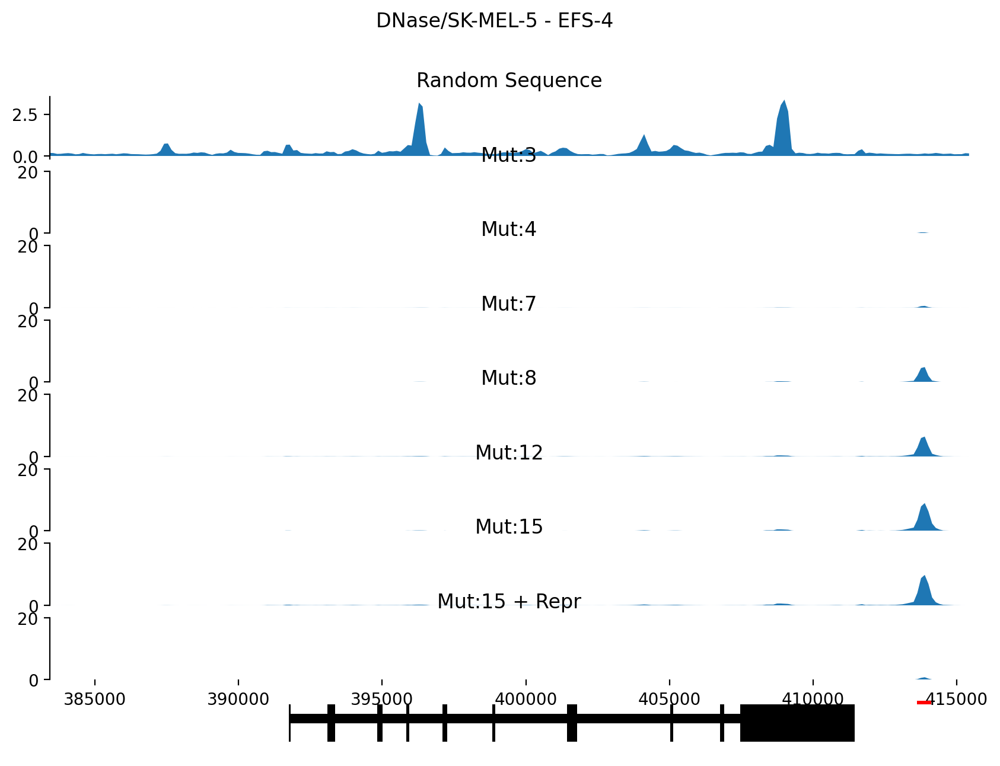

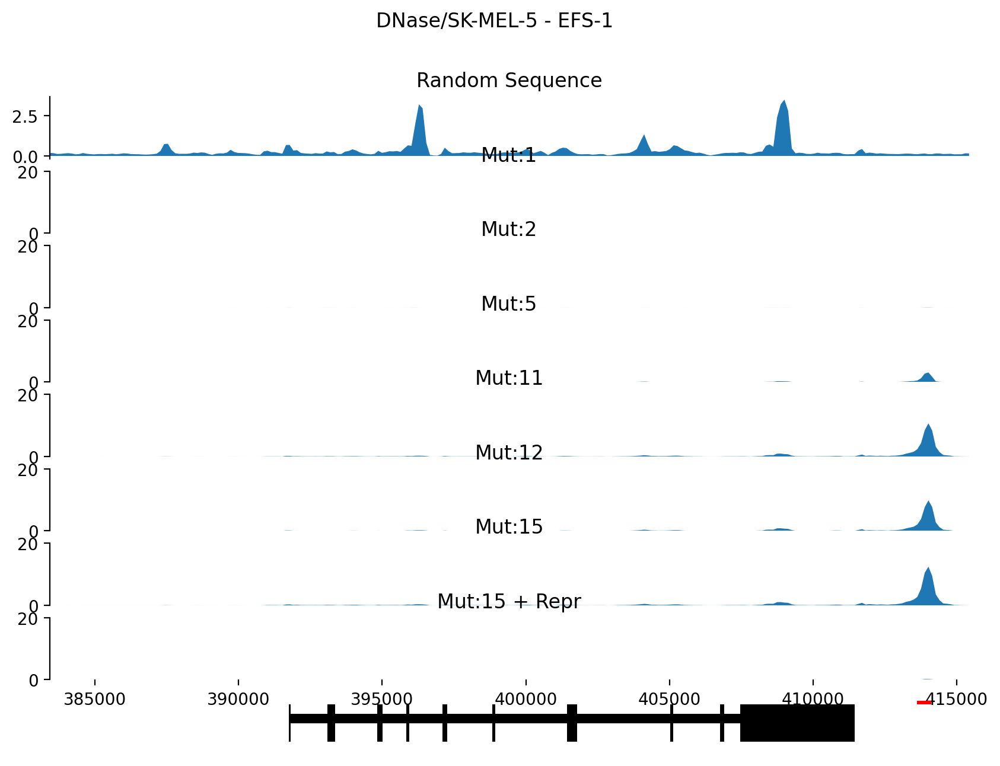

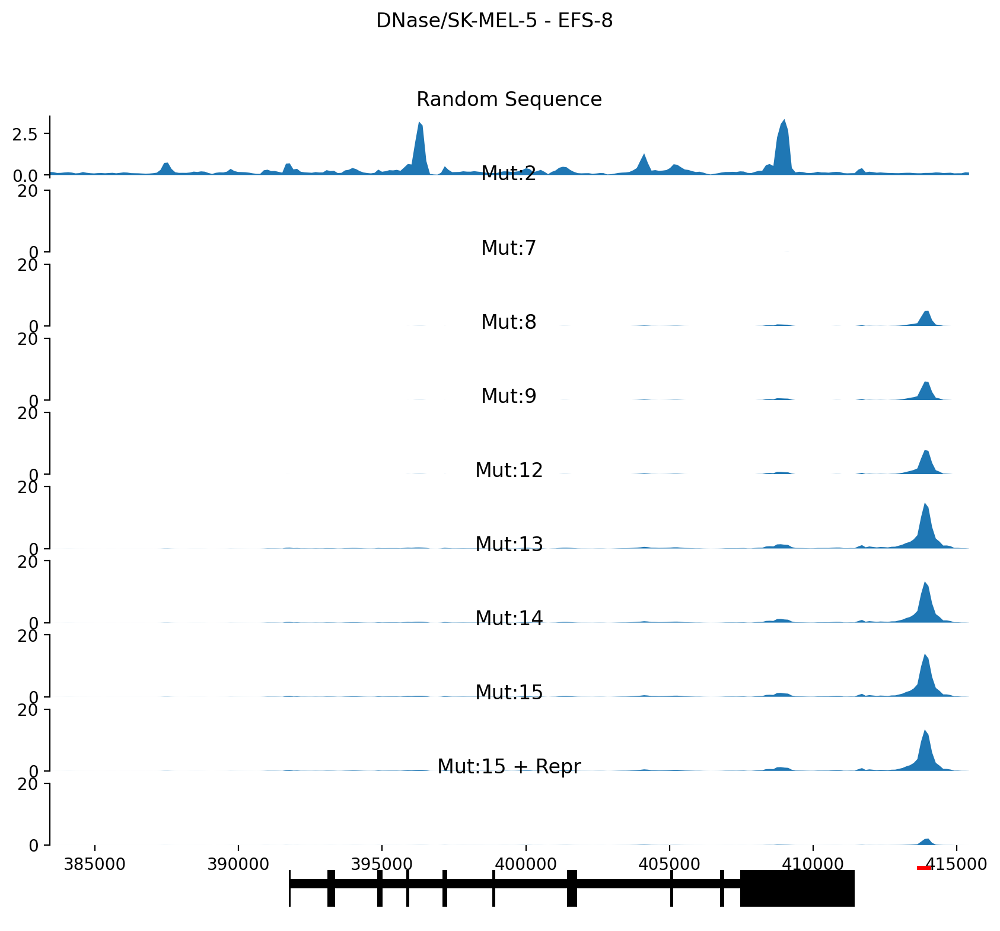

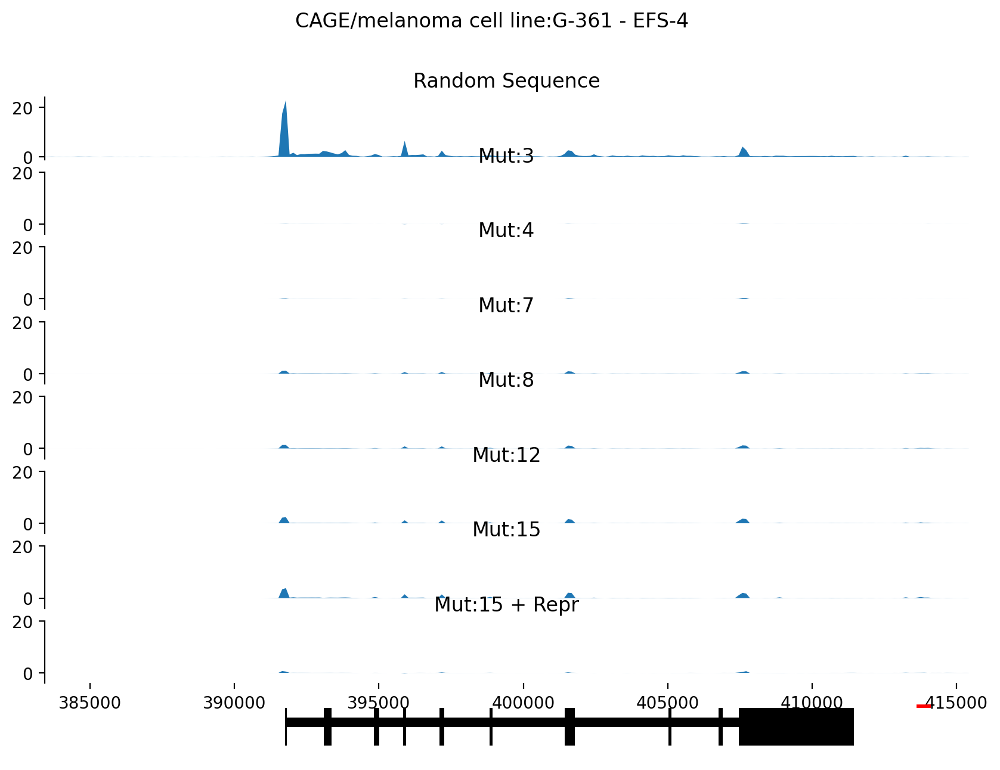

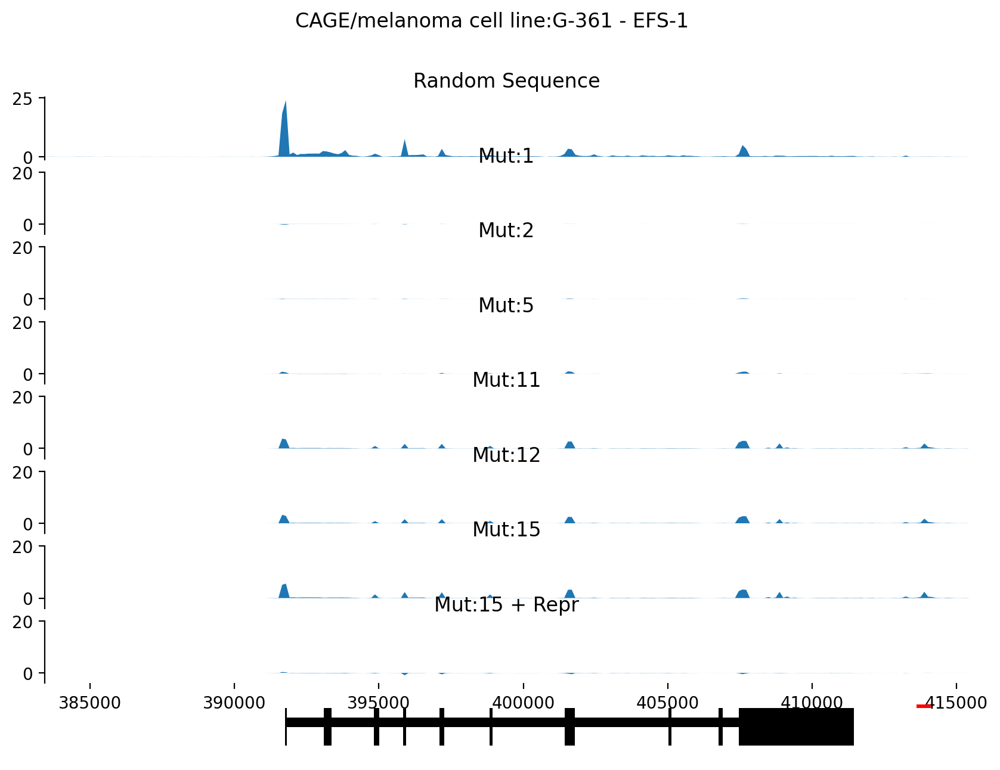

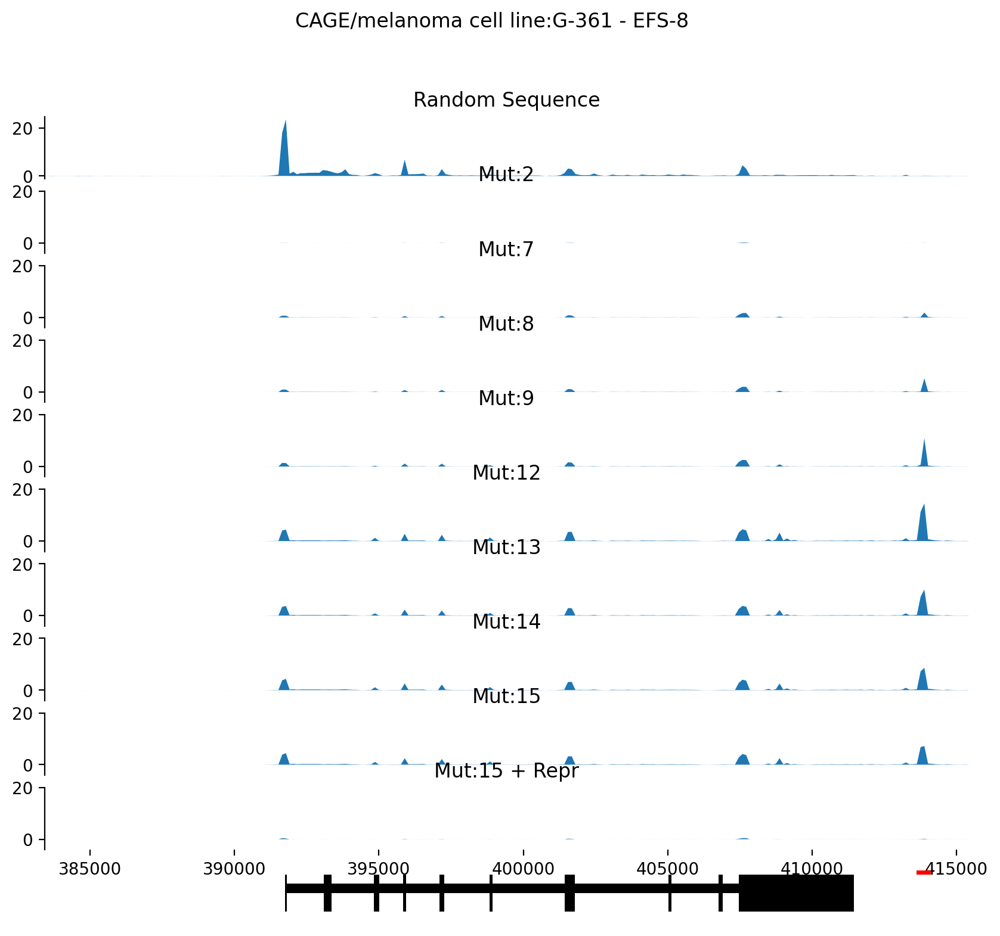

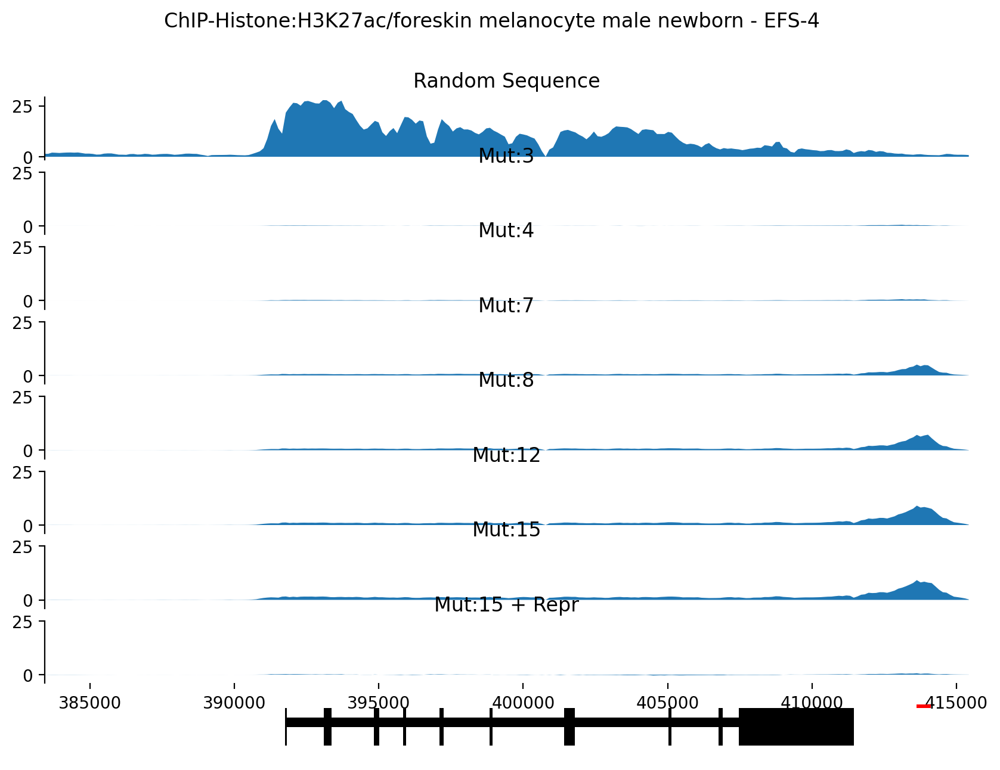

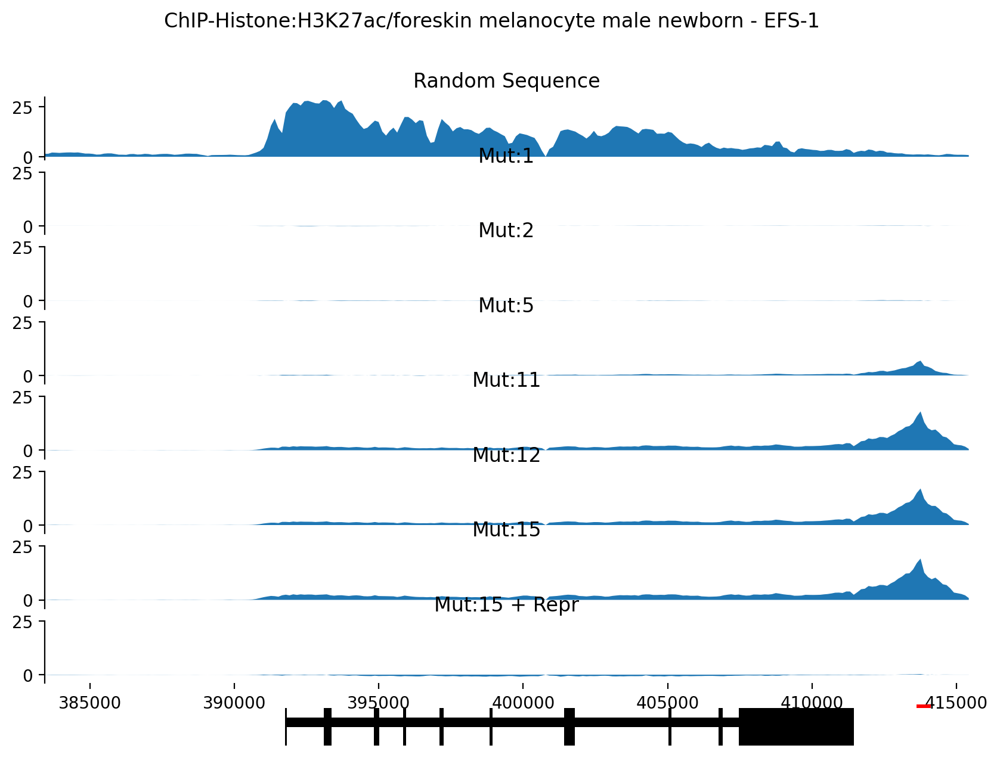

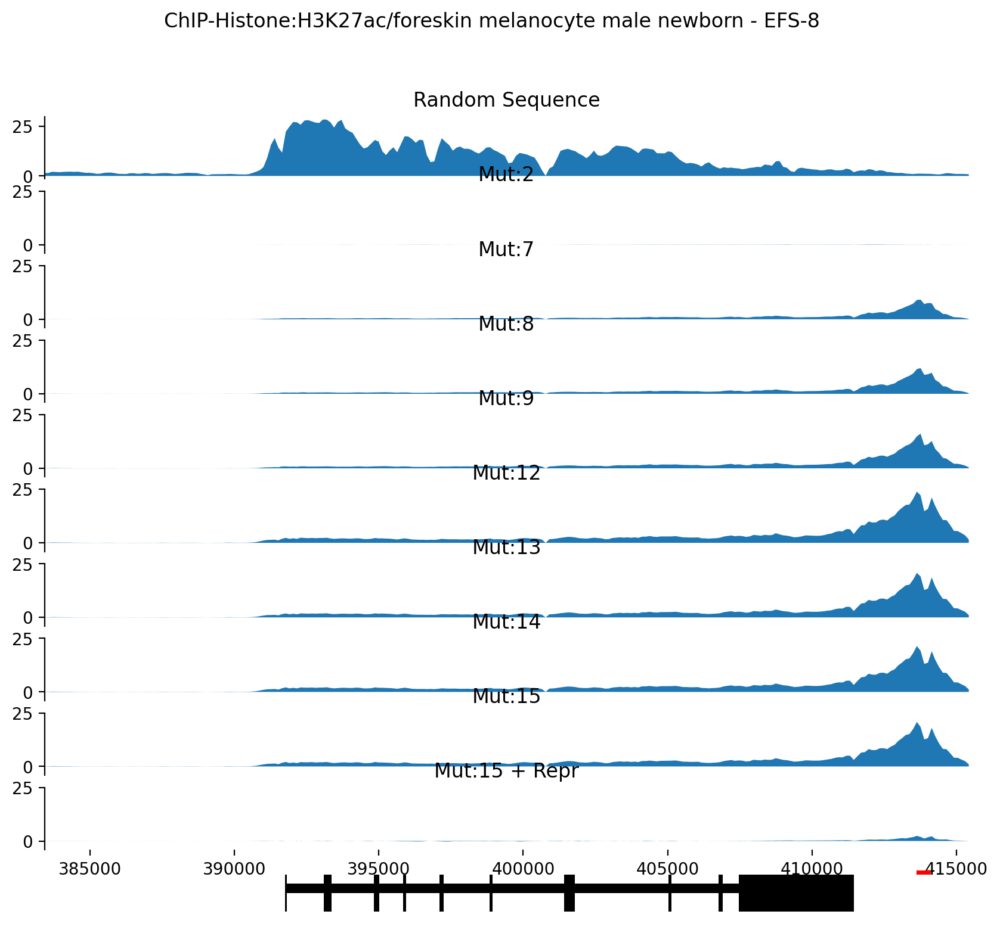

In [36]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

for id_,enformer_class,title_,name_,ymin_,y_max,muts in [[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]]:
    n_tracks = len(muts)+2
    fig = plt.figure(figsize=(10,0.8*n_tracks))
    fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,1,1)
    values = np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,1,i+2)
        values = np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_17500bpDown[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [n_tracks]:
        ax  = fig.add_subplot(n_tracks,1,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106+17500, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
    plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_"+title_+"_IRF4Locus_17500Down.pdf",transparent=True)
    

In [37]:
# nuc_to_onehot = {"A":[1, 0, 0, 0],"C":[0, 1, 0, 0],"G":[0, 0, 1, 0],"T":[0, 0, 0, 1]}

# predictions_irf4_efs_10kUp = {}
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh, end=": ")
#     predictions_irf4_efs_10kUp[genomic_enh] = {}
#     for id_ in [15,22,60]:
#         print(id_, end=', ')
#         predictions_irf4_efs_10kUp[genomic_enh][id_] = []
#         start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#         predictions_irf4_efs_10kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-10000))
#         for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#             start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#             predictions_irf4_efs_10kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-10000))            
#     print("")
    
# for genomic_enh in sequence_one_hot_i:
#     print(genomic_enh)

#     id_ = 22
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["113_A","164_A","210_C","215_C","216_A","259_G","291_G","300_T"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_10kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-10000))

#     id_ = 15
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["247_C","281_C","284_G","312_G","338_C","339_A","365_C","369_T","420_T","411_C","431_A","463_C"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_10kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-10000))

#     id_ = 60
#     start_x = np.copy(evolved_seq_4000_dict["X"][id_:id_+1])
#     for i, mut_ in enumerate(evolved_seq_4000_dict["mut_loc"][id_][:15]):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     muts = ["160_C","178_T","183_C","184_A","204_T","205_G","350_C","352_G","384_A"]
#     for i, mut_ in enumerate(muts):
#         start_x[0][int(mut_.split("_")[0]),:] = np.array(nuc_to_onehot[mut_.split("_")[1]], dtype='int8')
#     predictions_irf4_efs_10kUp[genomic_enh][id_].append(pred_3bp_shift(sequence_one_hot_i[genomic_enh],start_x[0],shift=-10000))
    
# import pickle
# f = open("data/enformer/predictions_irf4_efs_10kUp.pkl", "wb")
# pickle.dump(predictions_irf4_efs_10kUp, f ,protocol=4)
# f.close()

irf4_locus: 15, 22, 60, 
irf4_locus


In [56]:
import pickle
f = open("data/enformer/predictions_irf4_efs_10kUp.pkl", "rb")
predictions_irf4_efs_10kUp = pickle.load(f)
f.close()

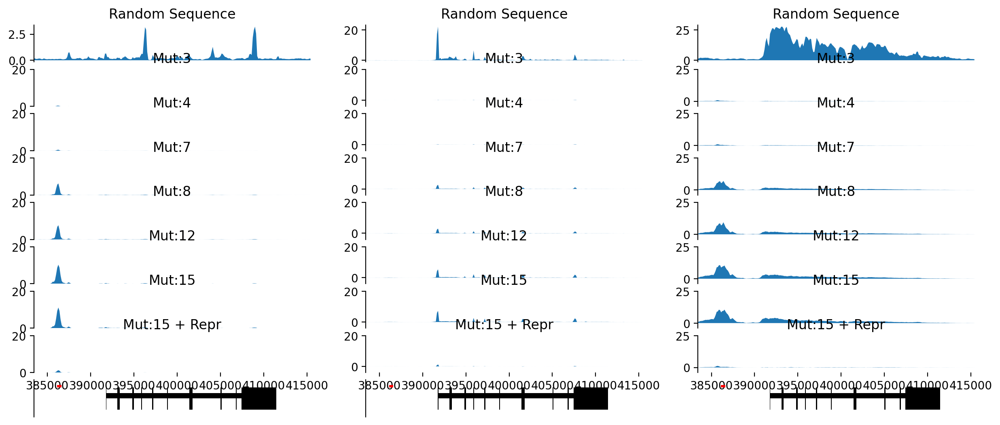

In [59]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

fig = plt.figure(figsize=(15,0.7*n_tracks))
for x,[id_,enformer_class,title_,name_,ymin_,y_max,muts] in  enumerate([[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],#[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],#[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],#[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]
                                                        ]):
    n_tracks = len(muts)+2
    
    #fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,3,x+1)
    values = np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,3,(i+1)*3+1+x)
        values = np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [(n_tracks-1)*3+x+1]:
        ax  = fig.add_subplot(n_tracks,3,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106-10000, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_IRF4Locus_10kbUp.pdf",transparent=True)
    

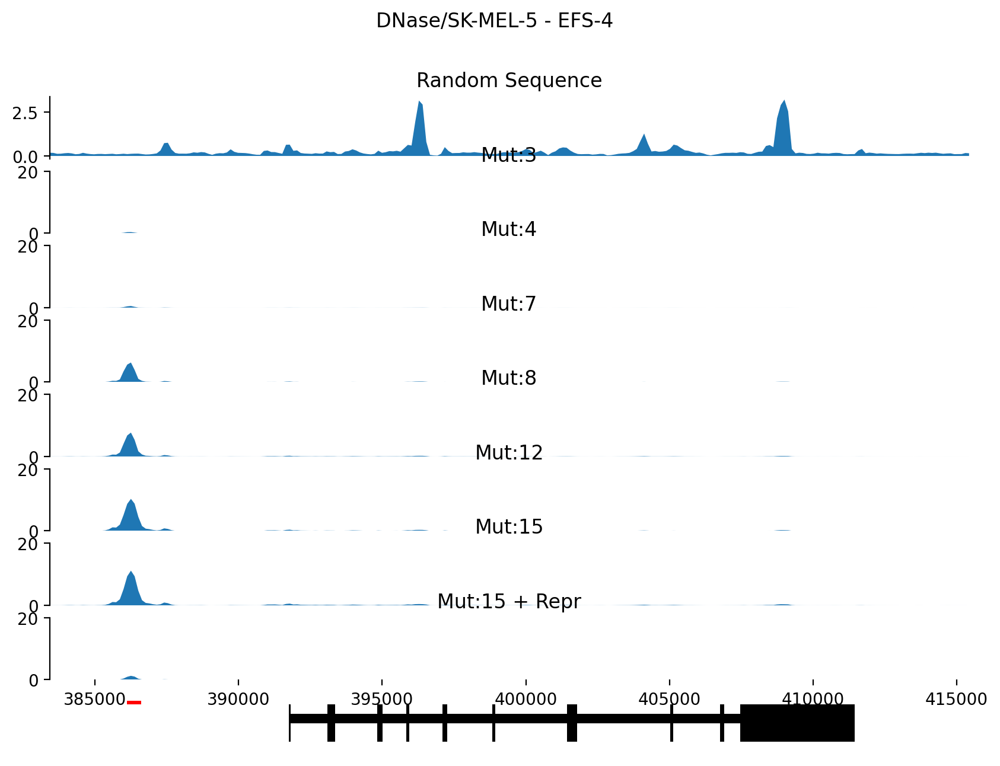

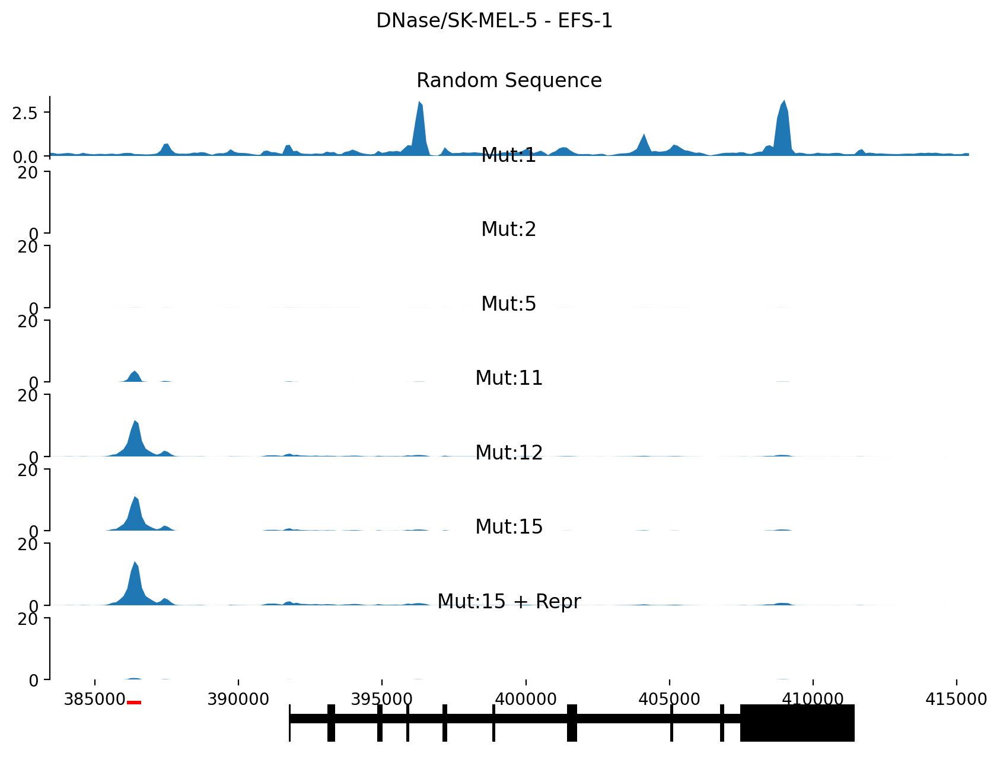

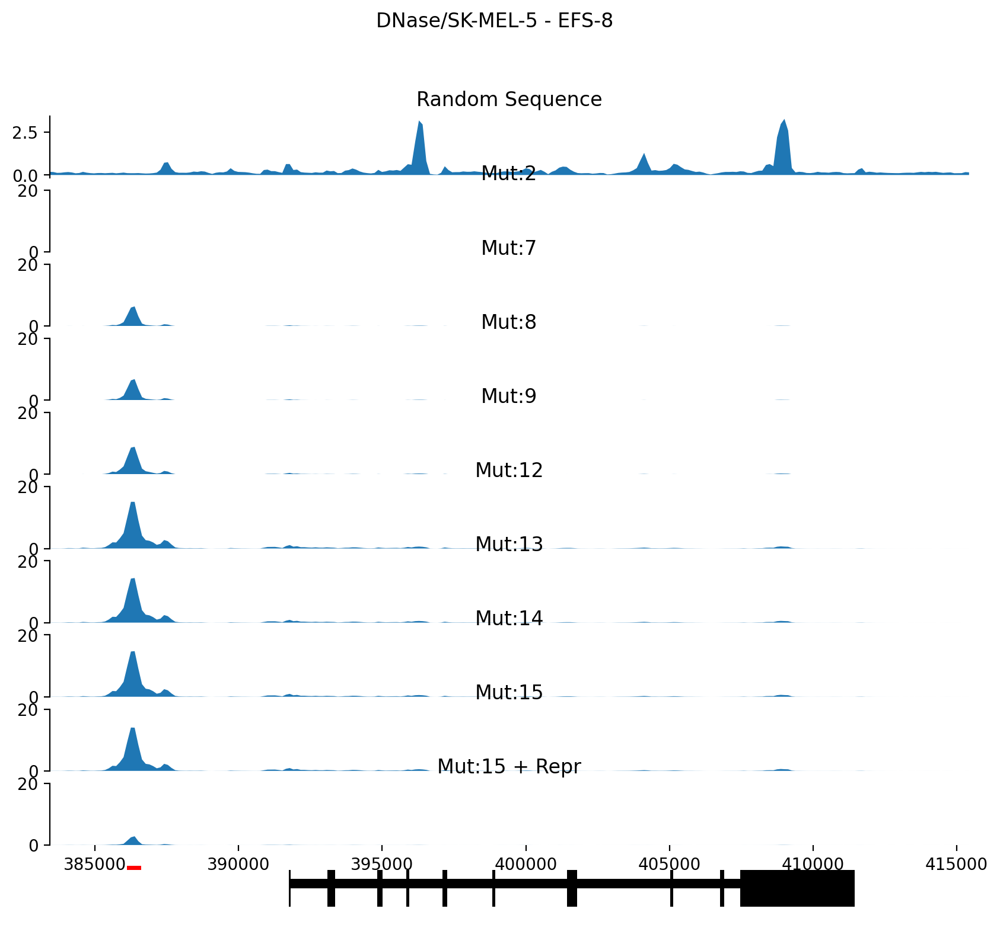

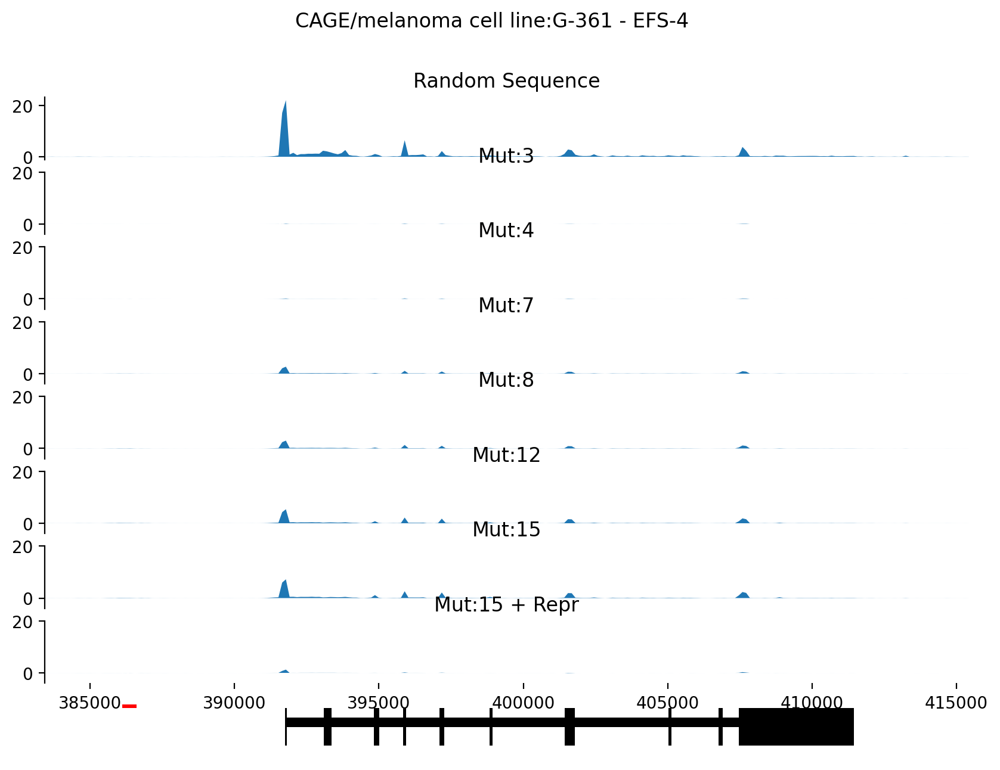

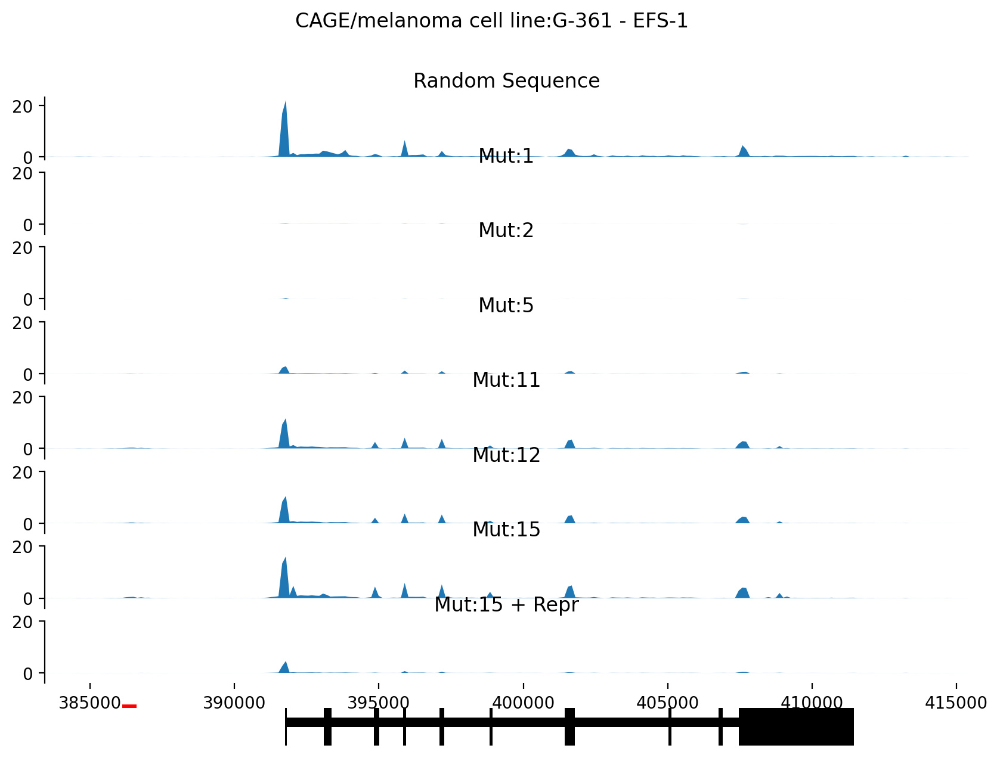

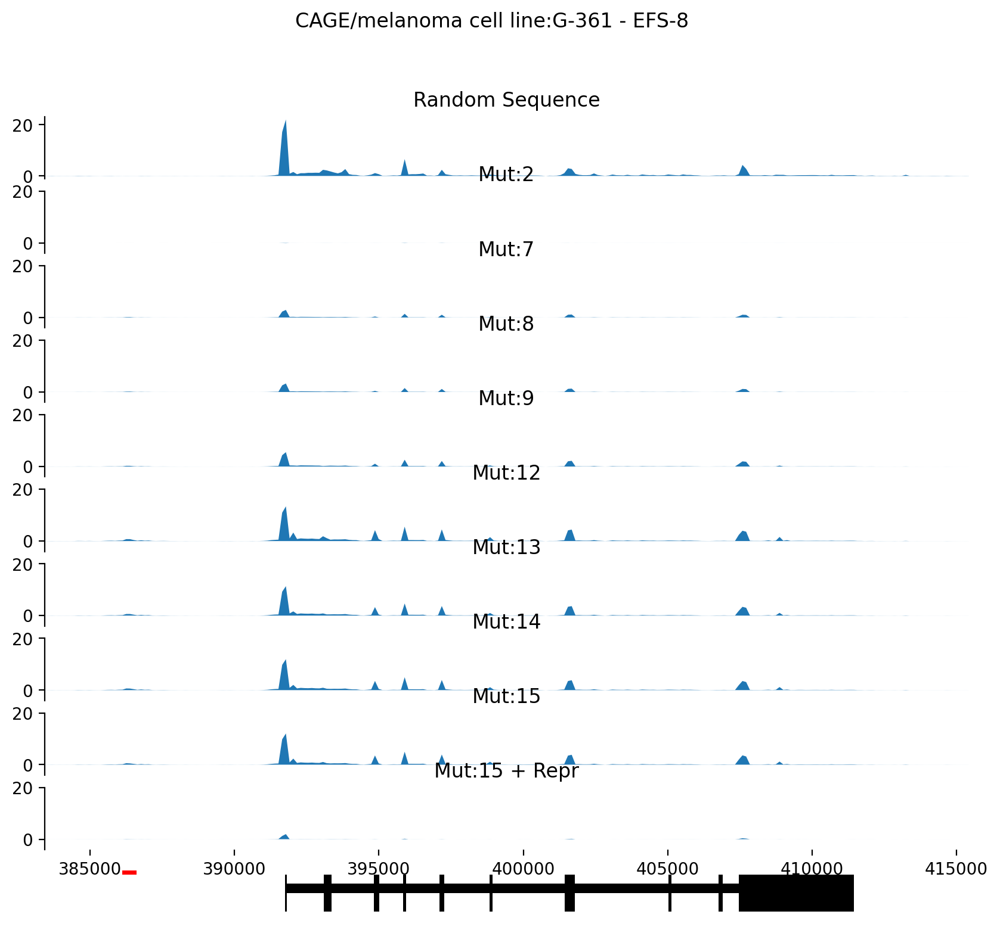

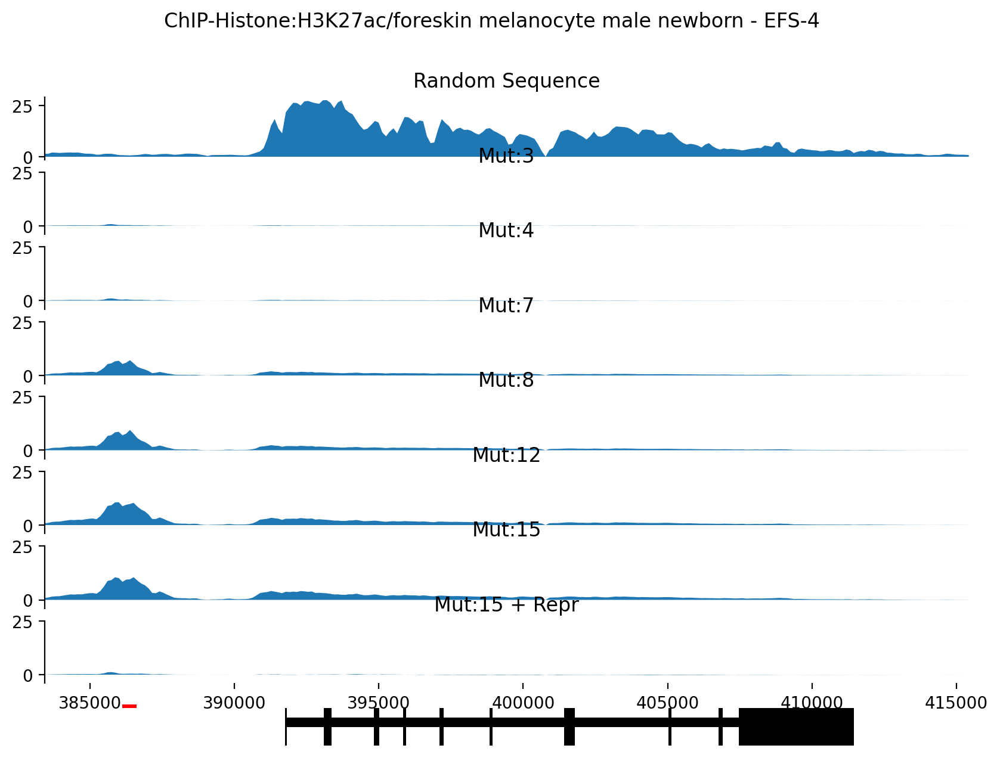

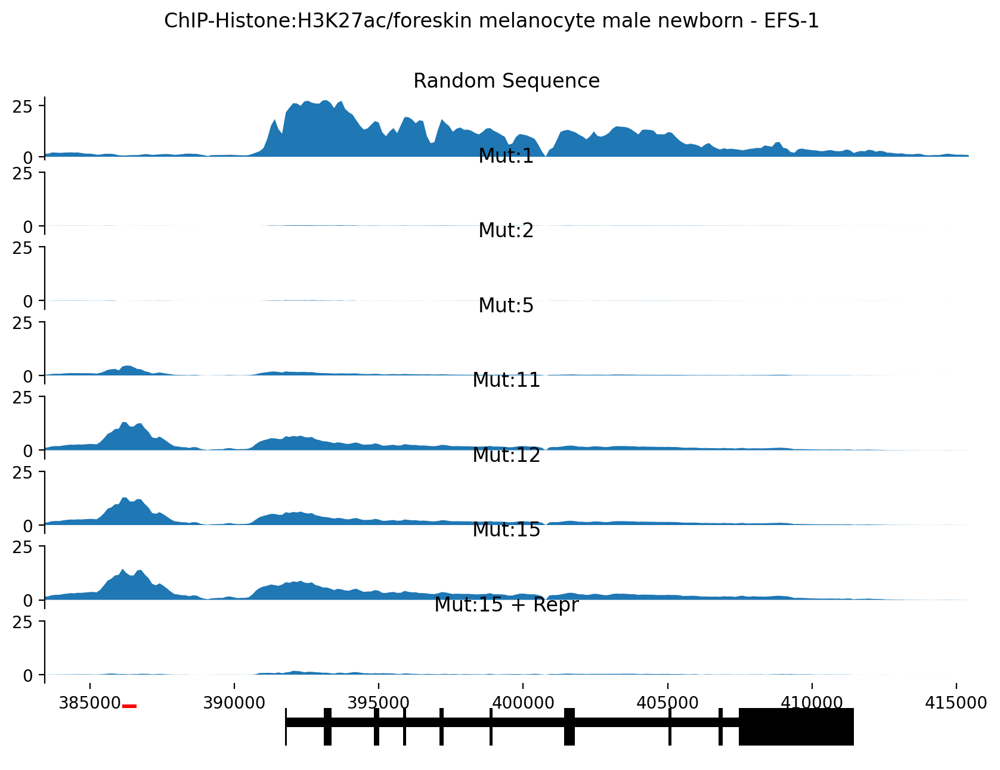

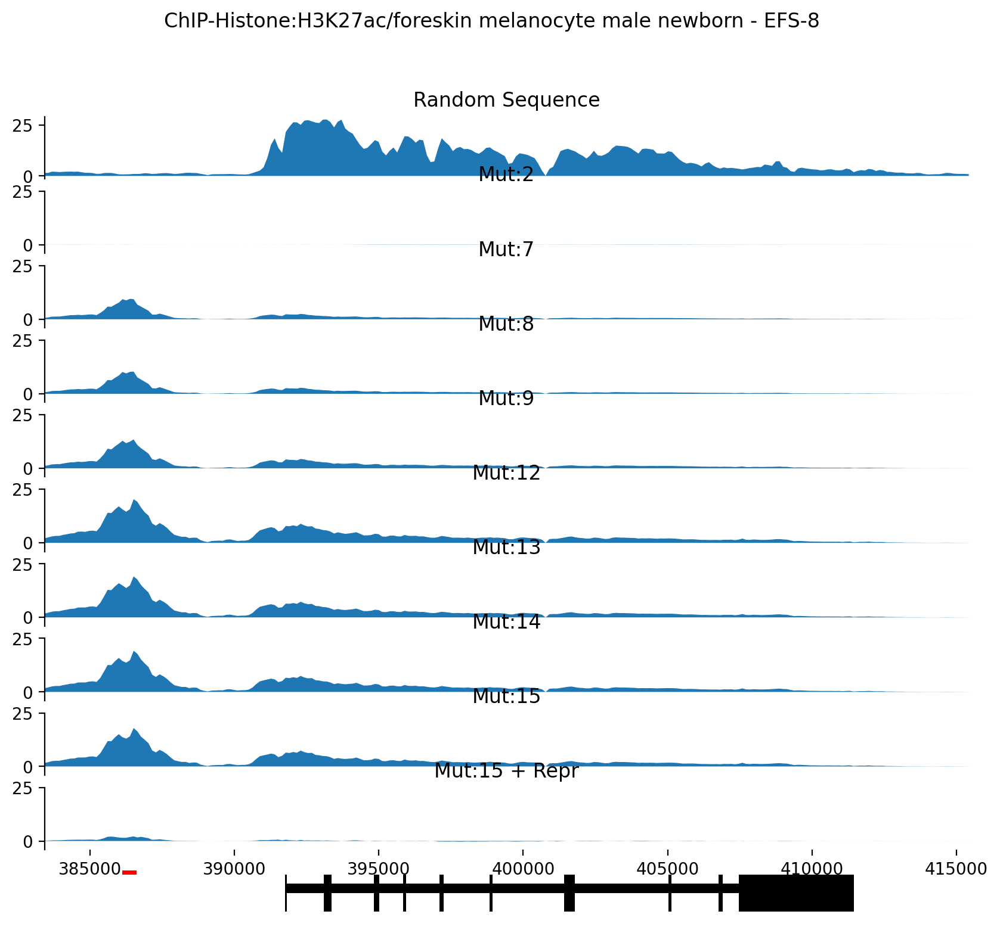

In [38]:
start = (396104-57094) + 128*(447-100)
end = (396104-57094) + 128*(447+150)

for id_,enformer_class,title_,name_,ymin_,y_max,muts in [[22, 162, "DNase","EFS-4", 0, 20, [3,4,7,8,12,15,16]],[15, 162, "DNase","EFS-1", 0, 20,[1,2,5,11,12,15,16]],[60, 162, "DNase","EFS-8", 0, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 4832, "CAGE","EFS-4", -4, 20, [3,4,7,8,12,15,16]],[15, 4832, "CAGE","EFS-1", -4, 20,[1,2,5,11,12,15,16]],[60, 4832, "CAGE","EFS-8", -4, 20,[2,7,8,9,12,13,14,15,16]],
                                                   [22, 2162, "H3K27ac","EFS-4", -4, 25, [3,4,7,8,12,15,16]],[15, 2162, "H3K27ac","EFS-1", -4, 25,[1,2,5,11,12,15,16]],[60, 2162, "H3K27ac","EFS-8", -4, 25,[2,7,8,9,12,13,14,15,16]]]:
    n_tracks = len(muts)+2
    fig = plt.figure(figsize=(10,0.8*n_tracks))
    fig.suptitle(enformer_classes[enformer_class]+" - "+name_)
    ax  = fig.add_subplot(n_tracks,1,1)
    values = np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
    ax.fill_between(np.linspace(0, len(values), num=len(values)),0,values)
    ax.set_xticks([])
    #ax.set_ylim(0,12)
    ax.set_title("Random Sequence")
    ax.margins(x=0)

    for i, n_mut in enumerate(muts):
        ax = fig.add_subplot(n_tracks,1,i+2)
        values = np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[n_mut][447-100:447+150,enformer_class] - np.array(predictions_irf4_efs_10kUp[genomic_enh][id_])[0][447-100:447+150,enformer_class]
        ax.fill_between(np.linspace(start, end, num=len(values)),0,values) 
        ax.set_ylim(ymin_,y_max)
        if n_mut==16:
            ax.set_title("Mut:15 + Repr")
        else:
            ax.set_title("Mut:"+str(n_mut))
        ax.margins(x=0)
        if i!=len(muts)-1:
            ax.set_xticks([])

    sns.despine(top=True, right=True, bottom=True)

    for ax_no in [n_tracks]:
        ax  = fig.add_subplot(n_tracks,1,ax_no)
        gtf_region_intersect = pr_irf4_gtf.intersect(pr_irf4_gtf)
        genes_in_window = set(gtf_region_intersect.gene_name)
        n_genes_in_window = len(genes_in_window)
        for idx, _gene in enumerate(genes_in_window):
            for _, part in gtf_region_intersect.df.loc[gtf_region_intersect.df['gene_name'] == _gene].iterrows():
                if part['Feature'] == 'exon':
                    exon_start = part['Start']
                    exon_end = part['End']
                    rect = mpatches.Rectangle(
                        (exon_start, -1), exon_end-exon_start, 2, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)
                elif part['Feature'] == 'transcript':
                    gene_start = part['Start']
                    gene_end = part['End']
                    rect = mpatches.Rectangle(
                        (gene_start, 0), (gene_end-gene_start), 0.5, fill=True, color="k", linewidth=0)
                    ax.add_patch(rect)

        rect = mpatches.Rectangle((396106-10000, 1), 396605-396106, 0.2, fill=True, color="r", linewidth=0)
        ax.add_patch(rect)
        ax.set_ylim([-2/1.2, 2/1.2])
        ax.set_xlim([start,end])
        sns.despine(top=True, right=True, left=True, bottom=True, ax=ax)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.patch.set_alpha(0)

    #fig.tight_layout()
    plt.savefig("figures/enformer/Enformer_"+name_+"_steps_prediction_"+title_+"_IRF4Locus_10kbUp.pdf",transparent=True)
    

### Calculating and plotting in silico saturation mutagenesis values on the IRF4 enhancer by using DNase and CAGE tracks

In [39]:
irf4_onehot = {}
irf4_onehot["more_ZEB2"] = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGGTGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTACCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACCTTGGTAGGTAAAAGAAGGTAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACCTAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACCTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_ZEB2"]   = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCGGATCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCGGATTTAGCCATATGACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_MITF"]   = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATAATGTAAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCAATATAACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["no_SOX10"]  = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGGATGACAGCTTGTGTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACATAAAACAGTACAGGTATCTCCATGTGCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")
irf4_onehot["wild-type"] = utils.one_hot_encode_along_row_axis("GCTGCCATTGGTGTGGATTTTAAGTTGGGGAGGGTCGGGCGTGTCCGCCTGTTGGAATATGCTTCTCAGGTCTTCTGGGAAACAGATGTTTTGTGGAAGTGGAAGATTTTGGAAGTAGTGCCTTATCATGTGAAACCACAGGGCAGCTGATCTCTTCAGGCTTTCTTGATGTGAATGACAGCTTTGTTTCATCCACTTTGGTGGGTAAAAGAAGGCAAATTCCCCTGTGGTACTTTTGGTGCCAGGTTTAGCCATATGACGAAGCTTTACATAAAACAGTACAAGTATCTCCATTGTCCTTTATGATCCTCCATGAGTGTTTTCACTTAGTCTGATGAAGGGTTCACTCCAGTCTTTTCGGATGATAAAATGCTTCGGCTGTCAGTCTAATAAGGGATTCCCTGAGGAGTTTGGAGGCTGTAAGAGCACCCCCCGTCTCAATGCCAGTGCTTCTTATCTCAGCCTCTCCTGCACTCCTTTACCCCCGTCTCGATGCCAGT")

In [40]:
# modified_sequence_one_hot = np.copy(sequence_one_hot_i['irf4_locus'])

# irf4_ism = utils.create_saturation_mutagenesis_x(modified_sequence_one_hot[196358:196358+500])
# irf4_ism['Prediction'] = []

# for i in tqdm(range(500*3)):
#     modified_sequence_one_hot[196358:196358+500,:] = irf4_ism['X'][i]
#     irf4_ism['Prediction'].append((model.predict_on_batch(modified_sequence_one_hot[np.newaxis])[species][0]))
    
# irf4_ism_DNase = np.copy(np.array(irf4_ism['Prediction'])[:,446:449,162])
# irf4_ism_CAGE = np.copy(np.array(irf4_ism['Prediction'])[:,412,4832])
# irf4_ids_CAGE = np.copy(np.array(irf4_ism['Prediction'])[:,412,4832])

# import pickle
# with open('data/enformer/IRF4_ISM_DNase_CAGE.pkl', 'wb') as f:
#     pickle.dump(irf4_ism_DNase, f)
#     pickle.dump(irf4_ism_CAGE, f)
#     pickle.dump( irf4_ism['ids'], f)

In [41]:
with open('data/enformer/IRF4_ISM_DNase_CAGE.pkl', 'rb') as f:
    irf4_ism_DNase = pickle.load(f)
    irf4_ism_CAGE = pickle.load(f)
    irf4_ism_ids = pickle.load(f)

In [42]:
def plot_mutagenesis_givenax_fast(mut_scores,ids_,original_prediction, fig, ntrack, track_no, title='Enformer ISM'):
    seq_shape = (500,4)
    arr_a = np.zeros(seq_shape[0])
    arr_c = np.zeros(seq_shape[0])
    arr_g = np.zeros(seq_shape[0])
    arr_t = np.zeros(seq_shape[0])
    mut_preds = mut_scores
    delta_pred = original_prediction - mut_preds
    for i,mut in enumerate(ids_):
        if mut.endswith("A"):
            arr_a[int(mut.split("_")[0])]=delta_pred[i]
        if mut.endswith("C"):
            arr_c[int(mut.split("_")[0])]=delta_pred[i]
        if mut.endswith("G"):
            arr_g[int(mut.split("_")[0])]=delta_pred[i]
        if mut.endswith("T"):
            arr_t[int(mut.split("_")[0])]=delta_pred[i]

    arr_a[arr_a == 0] = None
    arr_c[arr_c == 0] = None
    arr_g[arr_g == 0] = None
    arr_t[arr_t == 0] = None
    
    ax = fig.add_subplot(ntrack, 1, track_no)
    ax.set_ylabel('In silico\nMutagenesis\n')
    ax.set_title(title)
    ax.scatter(range(seq_shape[0]), -1*arr_a, label='A', color='green')
    ax.scatter(range(seq_shape[0]), -1*arr_c, label='C', color='blue')
    ax.scatter(range(seq_shape[0]), -1*arr_g, label='G', color='orange')
    ax.scatter(range(seq_shape[0]), -1*arr_t, label='T', color='red')
    ax.legend()
    ax.axhline(y=0, linestyle='--', color='gray')
    ax.set_xlim((0, seq_shape[0]))
    _ = ax.set_xticks(np.arange(0, seq_shape[0]+1, 10))

    return ax

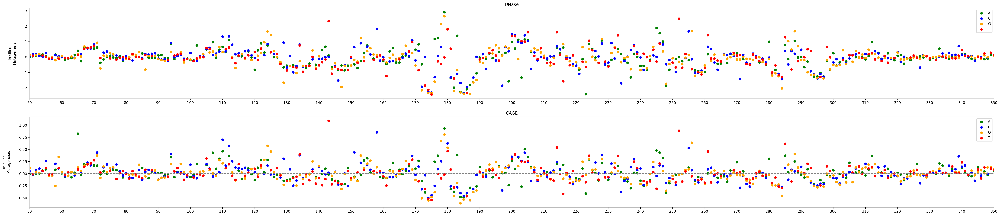

In [43]:
modified_sequence_one_hot = np.copy(sequence_one_hot_i['irf4_locus'])
original_pred_dnase = np.mean(model.predict_on_batch(modified_sequence_one_hot[np.newaxis])['human'][0][446:449,162])
original_pred_cage = model.predict_on_batch(modified_sequence_one_hot[np.newaxis])['human'][0][412,4832]

ntrack = 2
fig = plt.figure(figsize=(48,ntrack*5))
st = 50
end = 350
ax1 = plot_mutagenesis_givenax_fast(np.mean(irf4_ism_DNase, axis=1), irf4_ism_ids, original_pred_dnase, fig, ntrack, 1, title="DNase")
ax2 = plot_mutagenesis_givenax_fast(irf4_ism_CAGE, irf4_ism_ids, original_pred_cage, fig, ntrack, 2, title="CAGE")

ax1.set_xlim([st,end])
ax2.set_xlim([st,end])
plt.savefig("figures/enformer/IRF4_ISM_DNase_CAGE.pdf",transparent=True)